# Evaluating Sharpness Preservation

Get 10% and 50% MTFs for fbp, red-cnn, and red-cnn augmentation

In [1]:
from pathlib import Path
from dotenv import load_dotenv
import os

load_dotenv()

ldgc_path = Path(os.environ['LDGC_PATH']) # training dataset
peds_datadir = Path(os.environ['PEDIATRICIQ_PATH']) # testing dataset
anthro_datadir = Path(os.environ['ANTHROPOMORPHIC_PATH']) # testing dataset

ldgc_path.exists(), peds_datadir.exists(), anthro_datadir.exists()

(True, True, True)

In [2]:
if not ldgc_path.exists():
    raise RuntimeError(f'Low Dose Grand Challenge Dataset not found in {ldgc_path}, please download here: <https://aapm.app.box.com/s/eaw4jddb53keg1bptavvvd1sf4x3pe9h/folder/145241244881>')

from torchvision.datasets.utils import download_and_extract_archive
if not peds_datadir.exists():
    download_and_extract_archive(url='https://zenodo.org/records/11267694/files/pediatricIQphantoms.zip', download_root=peds_datadir.parent)

if not anthro_datadir.exists():
    download_and_extract_archive(url='https://zenodo.org/records/12538350/files/anthropomorphic.zip?download=1', download_root=anthro_datadir.parent)

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

In [4]:
meta = pd.read_csv(peds_datadir / 'metadata.csv')
meta.file = meta.file.apply(lambda o: peds_datadir.parent / o.split('../data/')[1])
meta = meta[meta.phantom == 'CTP404']
meta.head()

,Name,effective diameter [cm],age [year],pediatric subgroup,phantom,scanner,Dose [%],recon,kernel,FOV [cm],...,instance,Unnamed: 0,Code #,gender,weight [kg],height [cm],BMI,weight percentile,ethnicity,simulated
0,11.2 cm CTP404,11.2,0.083333,newborn,CTP404,Siemens Somatom Definition,25.0,fbp,D45,12.3,...,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,11.2 cm CTP404,11.2,0.083333,newborn,CTP404,Siemens Somatom Definition,25.0,fbp,D45,12.3,...,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,11.2 cm CTP404,11.2,0.083333,newborn,CTP404,Siemens Somatom Definition,25.0,fbp,D45,12.3,...,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,11.2 cm CTP404,11.2,0.083333,newborn,CTP404,Siemens Somatom Definition,25.0,fbp,D45,12.3,...,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,11.2 cm CTP404,11.2,0.083333,newborn,CTP404,Siemens Somatom Definition,25.0,fbp,D45,12.3,...,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
meta.recon.unique()

array(['fbp', 'RED-CNN', 'RED-CNN augmented'], dtype=object)

1. move the CTP404 phantom simulations from `/gpfs_projects/brandon.nelson/DLIR_Ped_Generalizability/geometric_phantom_studies/main/geometric/CTP404` to `/gpfs_projects/brandon.nelson/PediatricCTSizeDataAugmentation/CTP404_peds` - **done**
2. add metaheaders to make them easier to load, with pixel size and recon info? -> dicom eventually for this last one - **done**
3. make metadata csv like for CCT189 - **done**

4. make sure Ct numbers have 0 offset, so air == -1000, water == 0 - **done**
5. run denoisers on the CTP dataset - **done**
6. then run /home/brandon.nelson/Dev/DLIR_Ped_Generalizability/geometric_phantom_studies/evaluation/MTF

In [6]:
import SimpleITK as sitk
vol = sitk.ReadImage(meta.file[0])
vol.GetDepth(), vol.GetWidth(), vol.GetHeight()

(1, 512, 512)

In [7]:
meta[(meta['Dose [%]']==25)&
     (meta['effective diameter [cm]']==35)&
     (meta['FOV [cm]']==38.5)]

,Name,effective diameter [cm],age [year],pediatric subgroup,phantom,scanner,Dose [%],recon,kernel,FOV [cm],...,instance,Unnamed: 0,Code #,gender,weight [kg],height [cm],BMI,weight percentile,ethnicity,simulated
819,35.0 cm CTP404,35.0,39.0,adult,CTP404,Siemens Somatom Definition,25.0,fbp,D45,38.5,...,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
820,35.0 cm CTP404,35.0,39.0,adult,CTP404,Siemens Somatom Definition,25.0,fbp,D45,38.5,...,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
821,35.0 cm CTP404,35.0,39.0,adult,CTP404,Siemens Somatom Definition,25.0,fbp,D45,38.5,...,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
822,35.0 cm CTP404,35.0,39.0,adult,CTP404,Siemens Somatom Definition,25.0,fbp,D45,38.5,...,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
823,35.0 cm CTP404,35.0,39.0,adult,CTP404,Siemens Somatom Definition,25.0,fbp,D45,38.5,...,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
824,35.0 cm CTP404,35.0,39.0,adult,CTP404,Siemens Somatom Definition,25.0,fbp,D45,38.5,...,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
825,35.0 cm CTP404,35.0,39.0,adult,CTP404,Siemens Somatom Definition,25.0,fbp,D45,38.5,...,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
826,35.0 cm CTP404,35.0,39.0,adult,CTP404,Siemens Somatom Definition,25.0,fbp,D45,38.5,...,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
827,35.0 cm CTP404,35.0,39.0,adult,CTP404,Siemens Somatom Definition,25.0,fbp,D45,38.5,...,8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
828,35.0 cm CTP404,35.0,39.0,adult,CTP404,Siemens Somatom Definition,25.0,fbp,D45,38.5,...,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


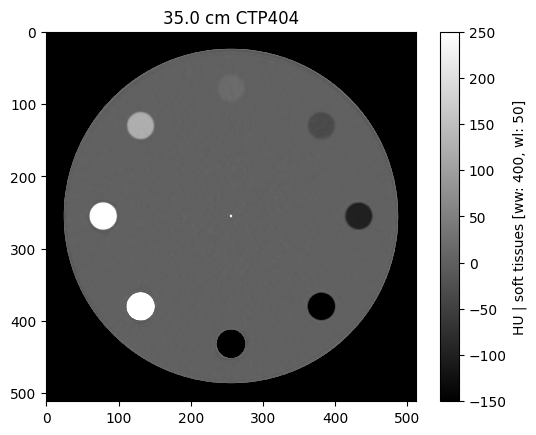

In [8]:
from utils import browse_studies, study_viewer
browse_studies(meta, phantom='CTP404',fov=38.5, dose=25, recon='RED-CNN')

In [9]:
study_viewer(meta)

interactive(children=(Dropdown(description='phantom', options=('CTP404',), value='CTP404'), Dropdown(descripti…

## Measuring MTF

### Selecting HU-Specific ROIs

In [10]:
meta['Dose [%]'].unique()

array([ 25., 100.])

In [11]:
from utils import get_ground_truth, load_mhd, ctshow
import SimpleITK as sitk
row = meta[(meta['Dose [%]']==100)&(meta['effective diameter [cm]']==35)].iloc[0]
file = row.file

gt_file = get_ground_truth(file)
file, gt_file

(PosixPath('/home/brandon.nelson/Dev/PediatricCTSizeAugmentation/data/pediatricIQphantoms/CTP404/diameter_350mm/dose_100/fbp/350mm_CTP404_000.dcm'),
 PosixPath('/home/brandon.nelson/Dev/PediatricCTSizeAugmentation/data/pediatricIQphantoms/CTP404/diameter_350mm/350mm_CTP404_groundtruth.dcm'))

Before correcting for aliasing, it is apparent when looking at a narrow window around each insert

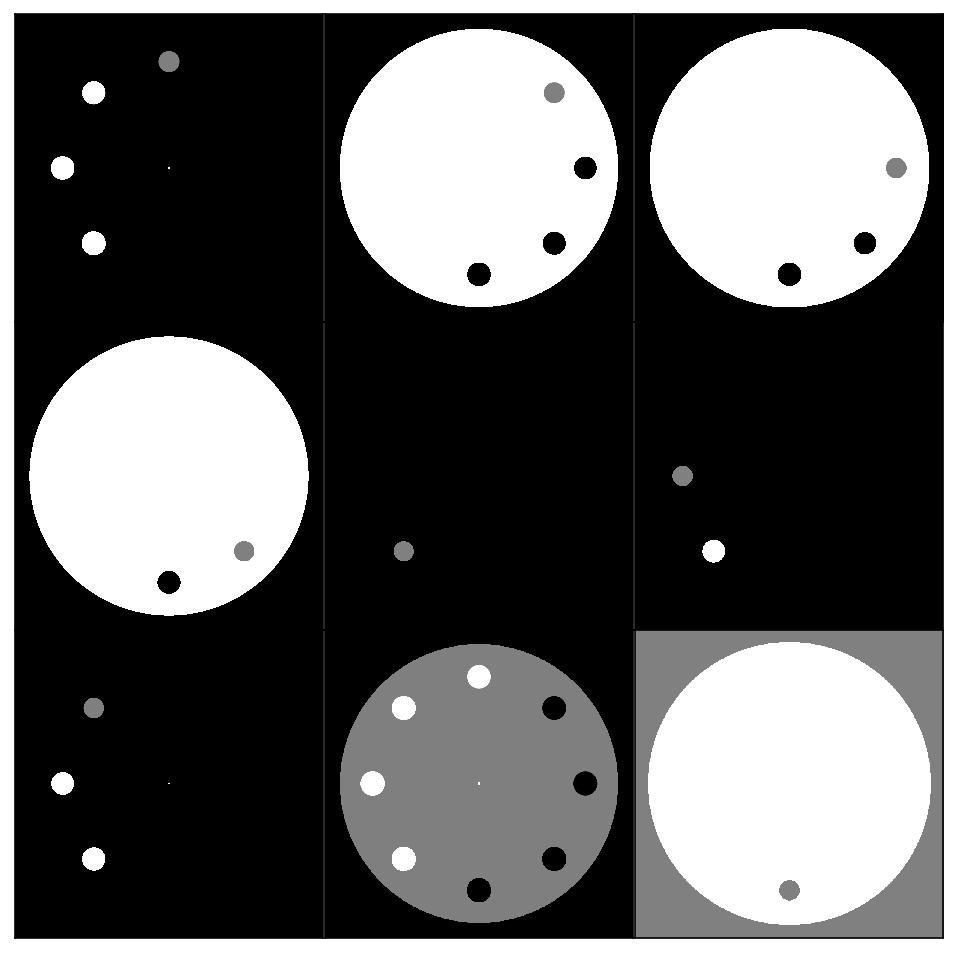

In [12]:
img = load_mhd(file)[0]
gt_img = load_mhd(gt_file)[0]
known_vals = [15, -35, -100, -200, 990, 340, 120, 0, -1000]
f, axs = plt.subplots(3, 3, gridspec_kw=dict(hspace=0, wspace=0), figsize=(8,8), dpi=150)
for val, ax in zip(known_vals, axs.flatten()):
    im = ctshow(gt_img, (5, val), fig=f, ax=ax)

## Remove Aliasing from noise free ground truth

In [13]:
def remove_aliasing_from_gt(gt_img, known_vals = [15, -35, -100, -200, 990, 340, 120, 0, -1000]):
    for val in known_vals:
        gt_img[np.isclose(gt_img, val, atol=8)] = val
    return gt_img

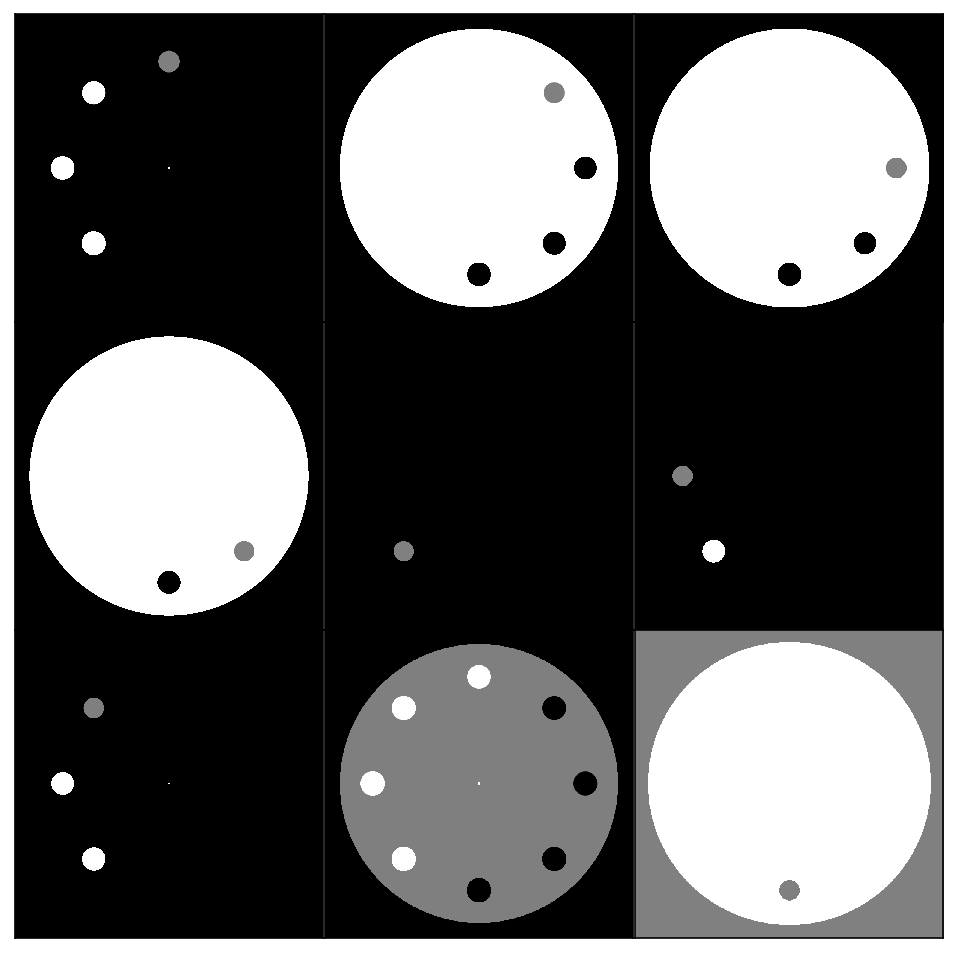

In [14]:
img = load_mhd(file)[0]
gt_img = load_mhd(gt_file)[0]
img.shape, gt_img.shape

gt_img = remove_aliasing_from_gt(gt_img)
    
f, axs = plt.subplots(3, 3, gridspec_kw=dict(hspace=0, wspace=0), figsize=(8,8), dpi=150)
for val, ax in zip(known_vals, axs.flatten()):
    im = ctshow(gt_img, (5, val), fig=f, ax=ax)

In [15]:
contrast_locations = pd.read_csv('/gpfs_projects/brandon.nelson/DLIR_Ped_Generalizability/geometric_phantom_studies/main/geometric/CTP404/monochromatic/diameter350mm/phantom_info_pix_idx.csv')
contrast_locations.rename(columns=dict(zip(contrast_locations.columns, list(map(lambda o: o.strip(), contrast_locations.columns)))), inplace=True)
water_attenuation_coefficient = contrast_locations[contrast_locations['x radius'] == contrast_locations['x radius'].max()]['mu [60 keV]'].item()
contrast_locations['Contrast [HU]'] = round((contrast_locations['mu [60 keV]'])/water_attenuation_coefficient*1000)
contrast_locations.loc[contrast_locations['mu [60 keV]']==water_attenuation_coefficient, 'Contrast [HU]'] = 0 
contrast_locations

,x center,y center,x radius,y radius,angle degree,mu [60 keV],Contrast [HU]
0,256,256,232.73000,232.73000,0,0.020590,0.0
1,256,433,18.61800,18.61800,0,0.000309,15.0
2,381,381,18.61800,18.61800,0,-0.000721,-35.0
3,433,256,18.61800,18.61800,0,-0.002059,-100.0
4,381,131,18.61800,18.61800,0,-0.004118,-200.0
5,256,79,18.61800,18.61800,0,-0.020590,-1000.0
6,131,131,18.61800,18.61800,0,0.020384,990.0
7,79,256,18.61800,18.61800,0,0.007001,340.0
8,131,381,18.61800,18.61800,0,0.002471,120.0
9,256,256,0.33247,0.33247,0,0.123540,6000.0


In [16]:
np.unique(gt_img), len(np.unique(gt_img))

(array([-1000,  -937,  -875,  -812,  -750,  -688,  -687,  -625,  -562,
         -500,  -437,  -375,  -312,  -250,  -200,  -187,  -175,  -163,
         -150,  -137,  -125,  -113,  -100,   -87,   -81,   -75,   -69,
          -63,   -62,   -56,   -50,   -44,   -35,   -26,   -25,   -24,
          -22,   -20,   -19,   -18,   -17,   -15,   -13,   -12,   -11,
           -9,     0,    15,    30,    38,    43,    45,    53,    60,
           62,    64,    68,    75,    83,    85,    90,    98,   105,
          106,   120,   149,   170,   191,   213,   234,   247,   248,
          255,   276,   298,   309,   319,   340,   371,   375,   433,
          495,   557,   619,   681,   742,   743,   804,   866,   928,
          990], dtype=int32),
 91)

There should be no more than 10 unique values in the ground truth image (8 inserts + background + foreground)

In [17]:
row

Name                                                          35.0 cm CTP404
effective diameter [cm]                                                 35.0
age [year]                                                              39.0
pediatric subgroup                                                     adult
phantom                                                               CTP404
scanner                                           Siemens Somatom Definition
Dose [%]                                                               100.0
recon                                                                    fbp
kernel                                                                   D45
FOV [cm]                                                                38.5
file                       /home/brandon.nelson/Dev/PediatricCTSizeAugmen...
patientid                                                                  7
studyid                                                                   45

In [18]:
def process_gt(gt_file):
    # pixel_size_mm = sitk.ReadImage(file).GetSpacing()[0]
    # min_area_mm2 = 50
    # size_thresh_pixels = min_area_mm2/(pixel_size_mm**2)
    gt_img = load_mhd(gt_file)[0]
    gt_img = remove_aliasing_from_gt(gt_img)
    gt_img = deblur_ground_truth(gt_img, size_thresh=80)
    return gt_img

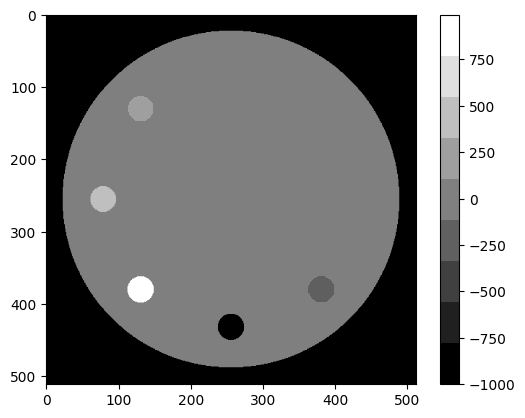

In [19]:
from skimage import measure
def deblur_ground_truth(gt_img, size_thresh=1000):
    label_image = measure.label(gt_img, background=-1000)
    mask = np.zeros_like(label_image)
    for label in np.unique(label_image):
        if (np.sum(label_image==label) < size_thresh): continue
        mask[label_image==label]=gt_img[label_image==label]
    return mask

gt_img = process_gt(gt_file)
plt.imshow(gt_img, cmap=plt.get_cmap('gray', len(np.unique(gt_img))))
plt.colorbar()

In [20]:
assert len(np.unique(gt_img)) == 9
np.unique(gt_img), len(np.unique(gt_img))

(array([-1000,  -200,  -100,   -35,     0,    15,   120,   340,   990]), 9)

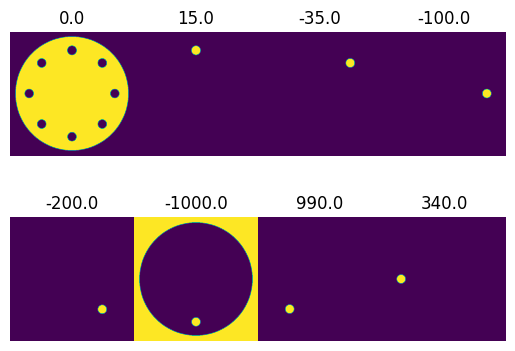

In [21]:
from skimage import data, util, measure
f, axs = plt.subplots(2,4, sharex=True, sharey=True, gridspec_kw=dict(hspace=0, wspace=0))
for ax, HU in zip(axs.flatten(), contrast_locations['Contrast [HU]']):
    ax.imshow((gt_img==HU)) #label = 0 is background, 1 is the largest object
    ax.set_title(HU)
    ax.axis('off')

Now add radial averaging... and loop through all contrasts and do this for all recons to get ESF --> MTF --> MTF10, MTF50

In [22]:
import numpy as np

def pol2cart(rho, phi):
    x = rho * np.cos(phi)
    y = rho * np.sin(phi)
    return(x, y)

def get_radial_coords(img, center, radius, angle, num=None):
    if num is None:
        num = np.ceil(radius).astype(int)
    coords = np.round(np.array(list(map(lambda r: pol2cart(r, phi=angle), np.linspace(0, radius, num=num))))+center).astype(int)
    return coords

def radial_profile(img, center, radius, angle, num=None):
    coords = get_radial_coords(img, center, radius, angle, num)
    return [img[x,y] for x, y in coords]

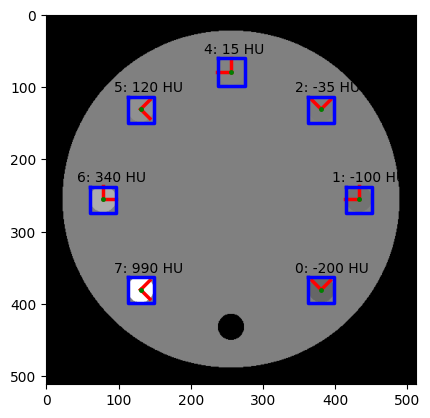

In [23]:
import math

regions = measure.regionprops(gt_img+1000)

fig, ax = plt.subplots()
ax.imshow(gt_img, cmap=plt.cm.gray)
for idx, props in enumerate(regions):
    if (props.label - 1000) == 0:
        continue
    y0, x0 = props.centroid
    orientation = props.orientation
    x1 = x0 + math.cos(orientation) * 0.5 * props.axis_minor_length
    y1 = y0 - math.sin(orientation) * 0.5 * props.axis_minor_length
    x2 = x0 - math.sin(orientation) * 0.5 * props.axis_major_length
    y2 = y0 - math.cos(orientation) * 0.5 * props.axis_major_length

    ax.plot((x0, x1), (y0, y1), '-r', linewidth=2.5)
    ax.plot((x0, x2), (y0, y2), '-r', linewidth=2.5)
    ax.plot(x0, y0, '.g', markersize=5)
    ax.annotate(f'{idx}: {props.label-1000} HU', (x0-props.axis_major_length, y0-props.axis_major_length/1.5))

    minr, minc, maxr, maxc = props.bbox
    bx = (minc, maxc, maxc, minc, minc)
    by = (minr, minr, maxr, maxr, minr)
    ax.plot(bx, by, '-b', linewidth=2.5)
plt.show()

In [24]:
45+180

225

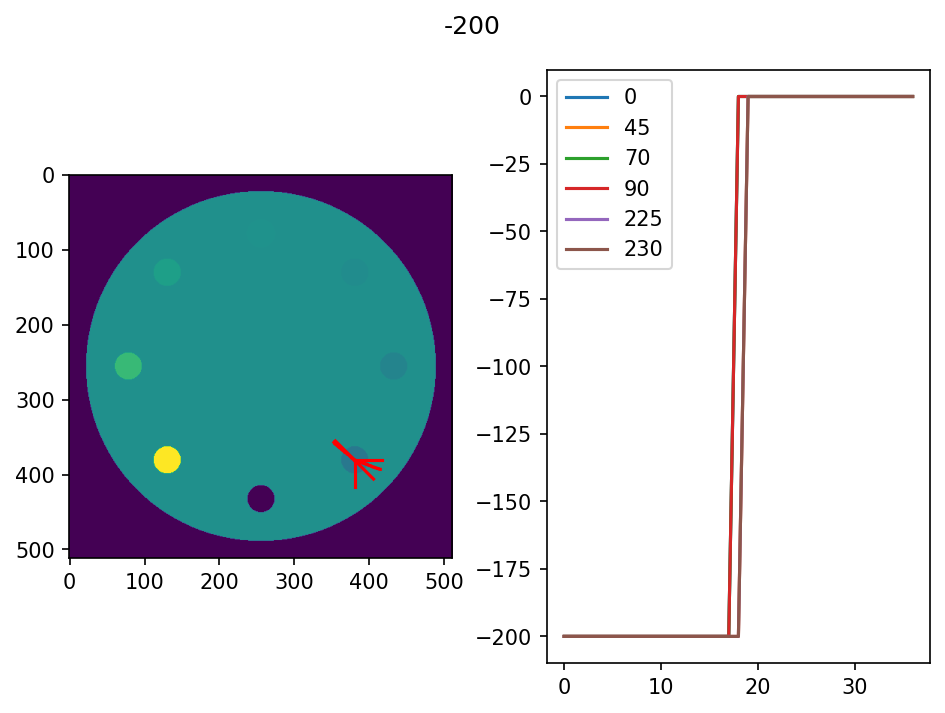

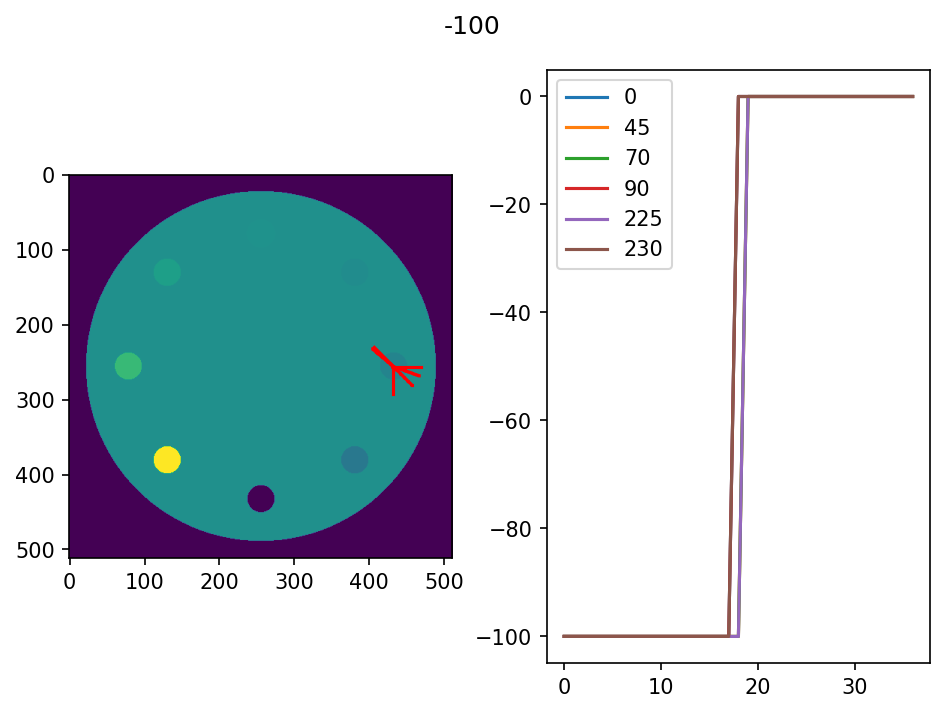

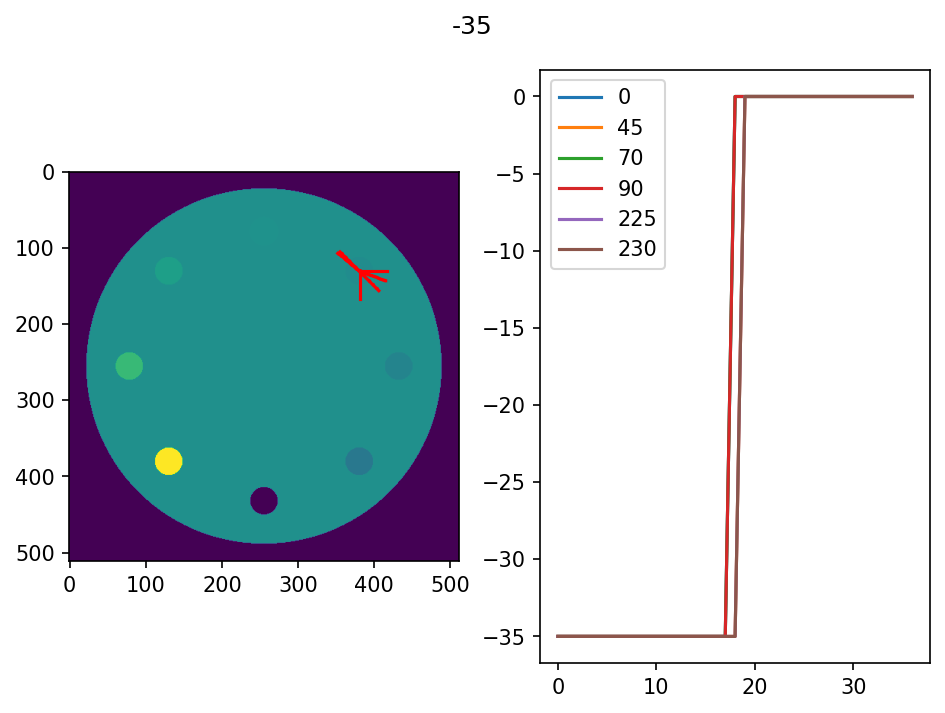

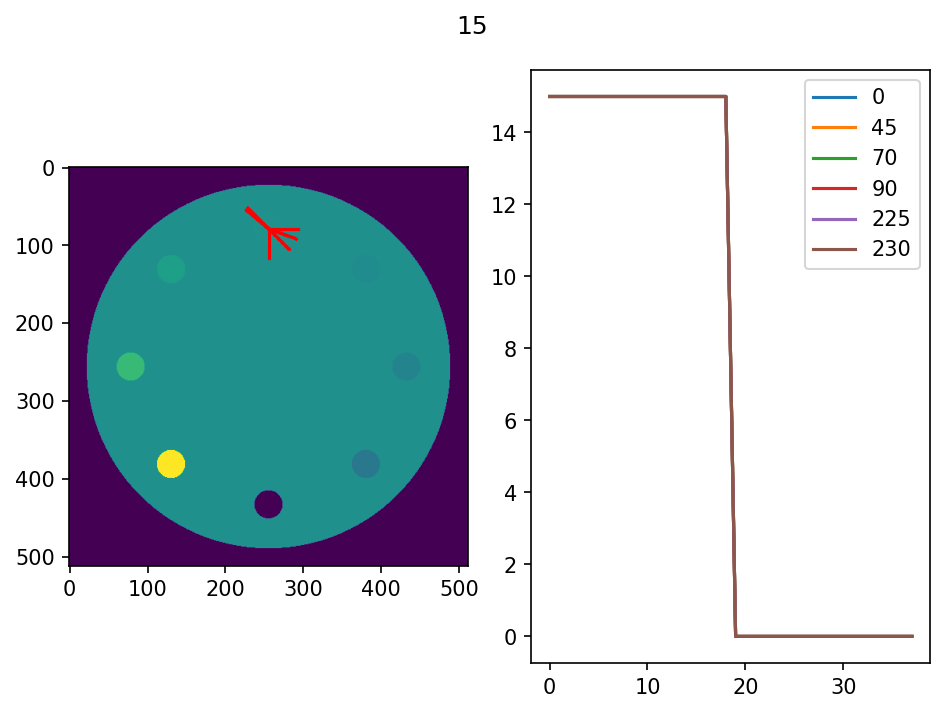

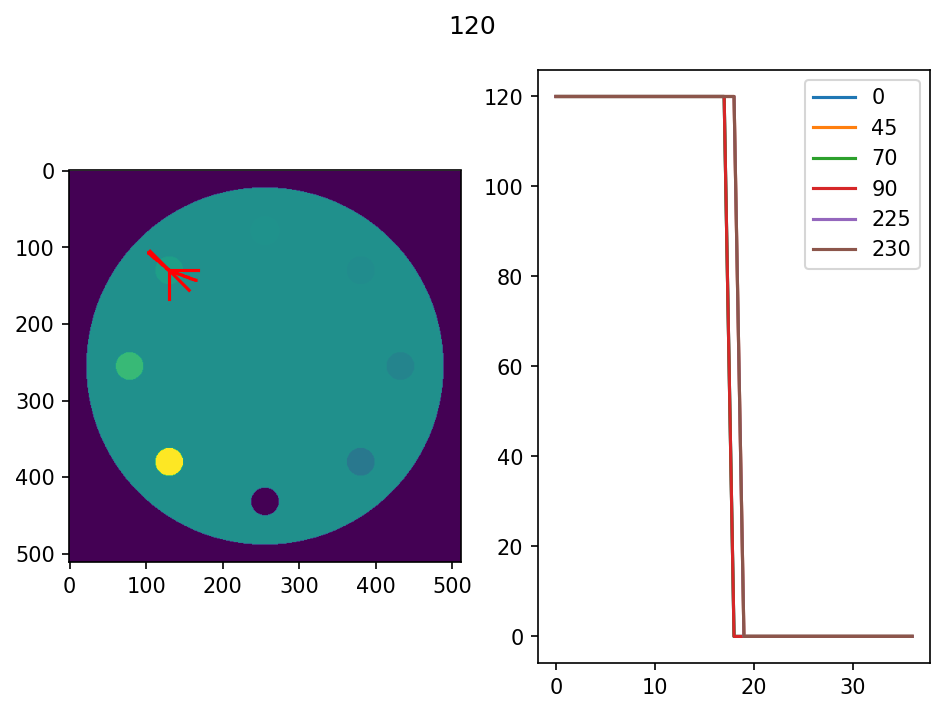

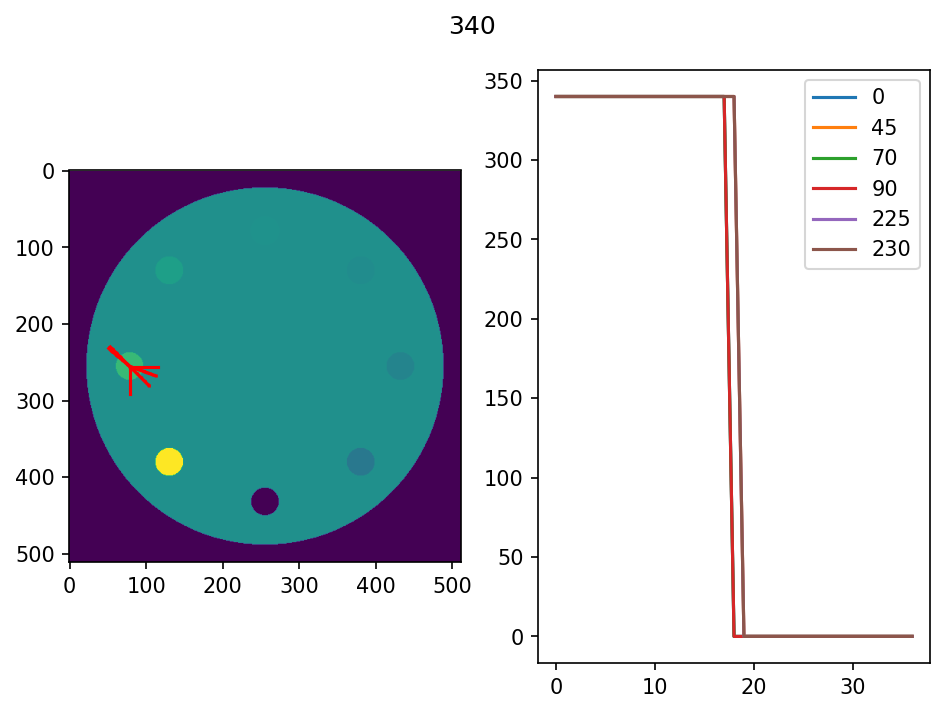

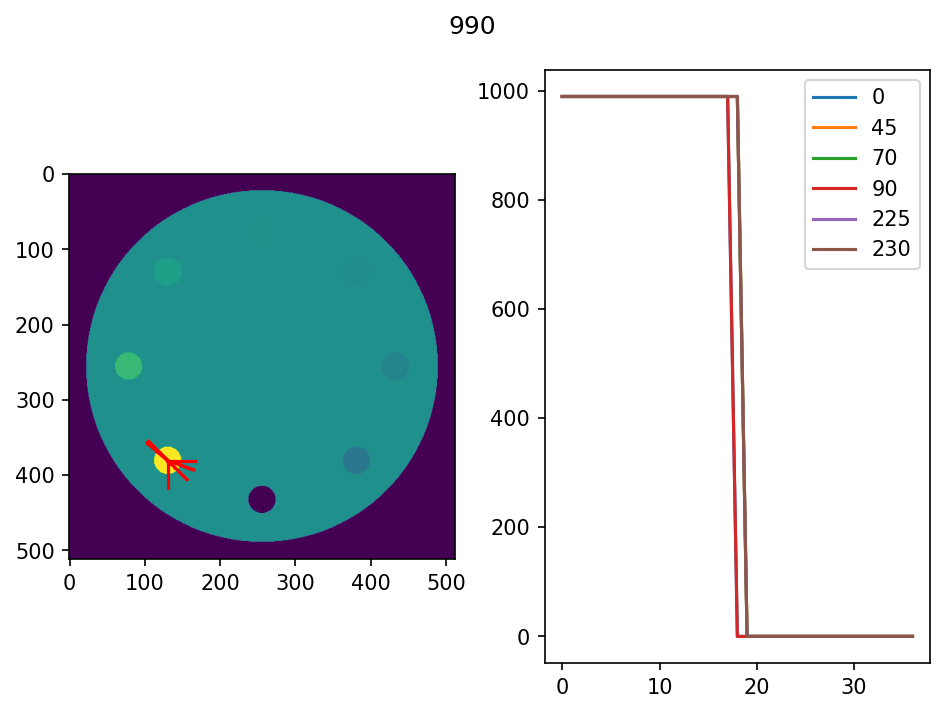

In [25]:
for region in regions:
    contrast = region.label-1000
    if contrast == 0: continue
    f, axs = plt.subplots(1, 2, tight_layout=True, dpi=150)

    for deg in [0, 45, 70, 90, 225, 230]:
        center = region.centroid
        radius = np.mean([region.axis_major_length, region.axis_minor_length])/2
        coords = get_radial_coords(gt_img, center, 2*radius, np.deg2rad(deg))
        axs[0].imshow(gt_img)
        axs[0].plot(coords[:, 1], coords[:, 0], color='red', label=deg)

        axs[1].plot(gt_img.flat[np.ravel_multi_index(coords.T, gt_img.shape)], label=deg)
    axs[1].legend()
    f.suptitle(f'{contrast}')
    plt.show()

In [26]:
measured_centers = {r.label-1000:np.array(r.centroid).round() for r in regions}
measured_centers

{-200: array([381., 381.]),
 -100: array([256., 432.]),
 -35: array([130., 381.]),
 0: array([256., 255.]),
 15: array([ 79., 256.]),
 120: array([130., 130.]),
 340: array([256.,  79.]),
 990: array([381., 130.])}

In [27]:
true_centers = {c: contrast_locations.loc[contrast_locations['Contrast [HU]']==c, ['x center', 'y center']].to_numpy().T.squeeze() for c in measured_centers}
true_centers

{-200: array([381, 131]),
 -100: array([433, 256]),
 -35: array([381, 381]),
 0: array([256, 256]),
 15: array([256, 433]),
 120: array([131, 381]),
 340: array([ 79, 256]),
 990: array([131, 131])}

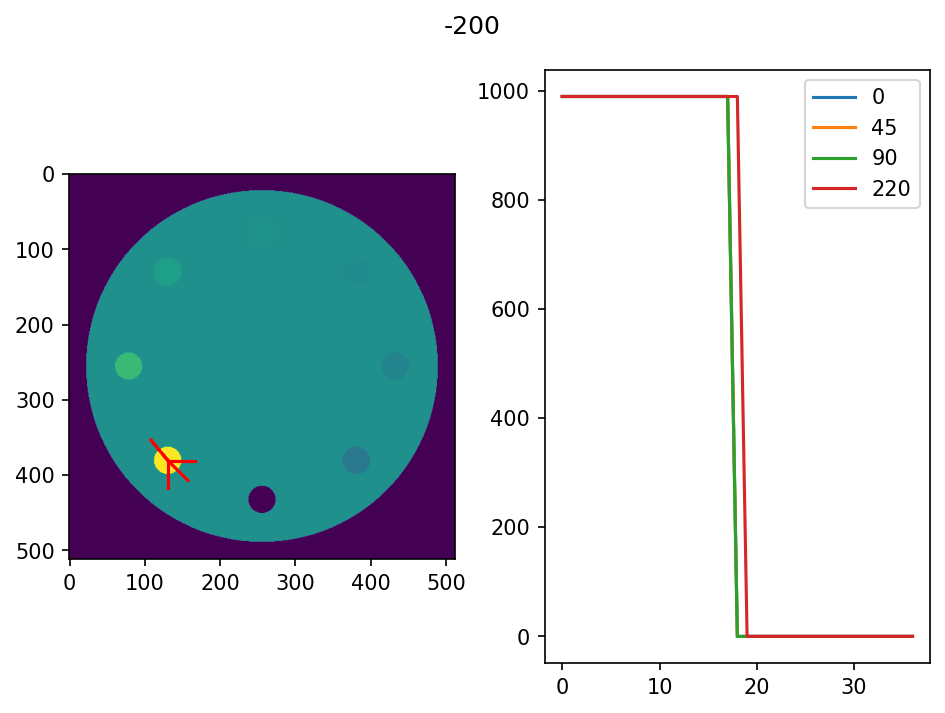

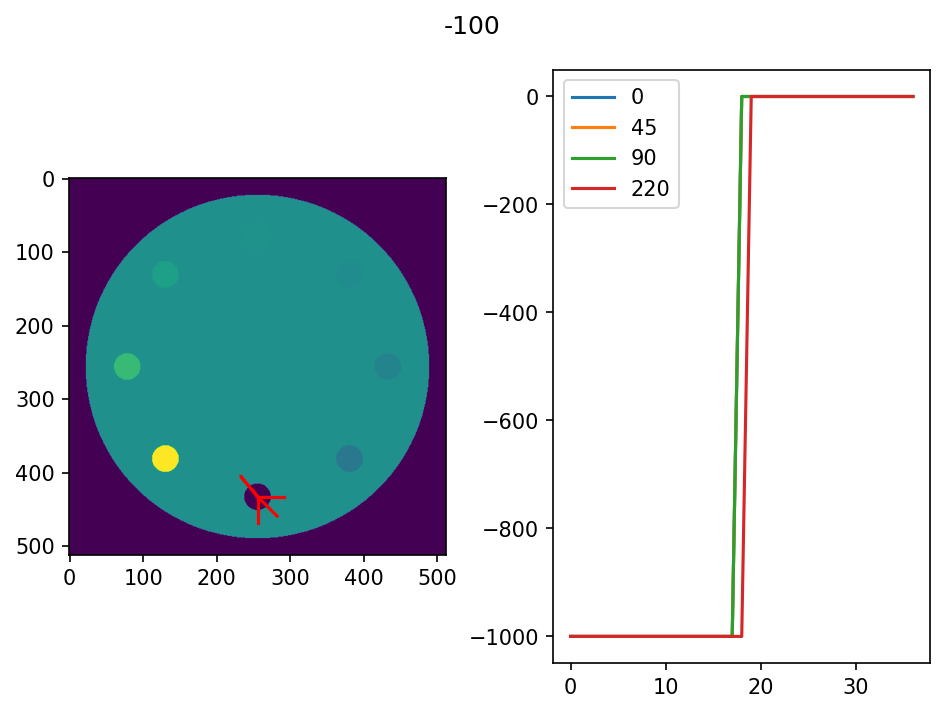

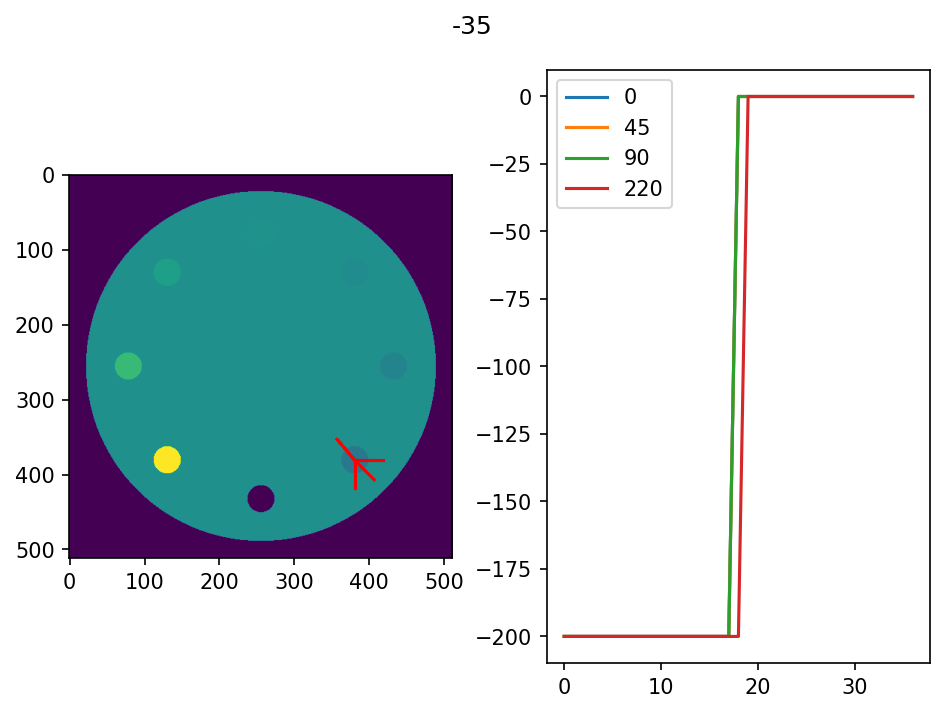

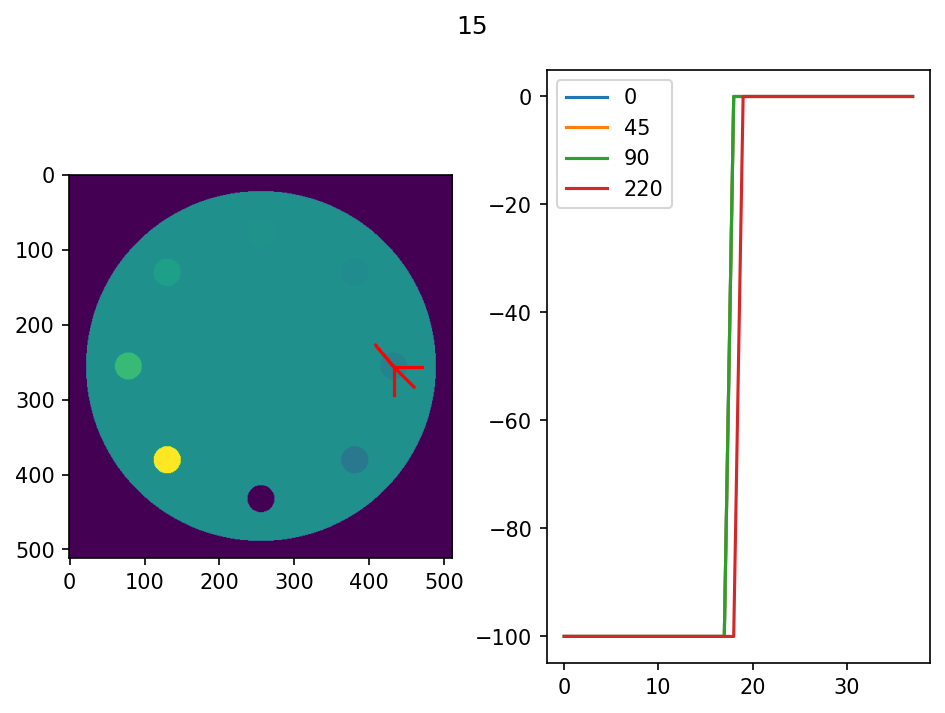

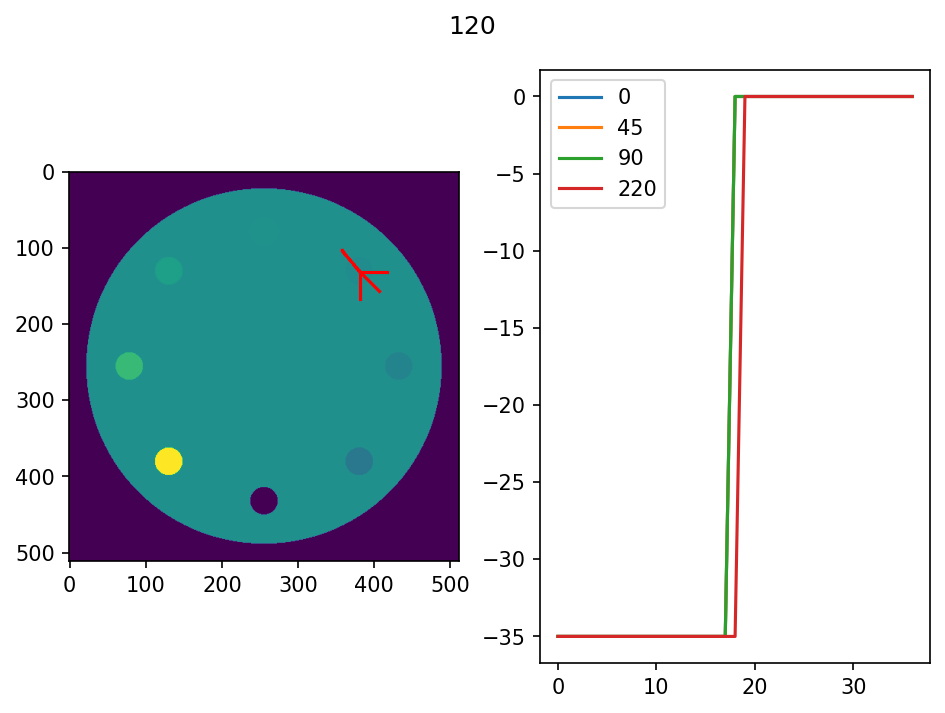

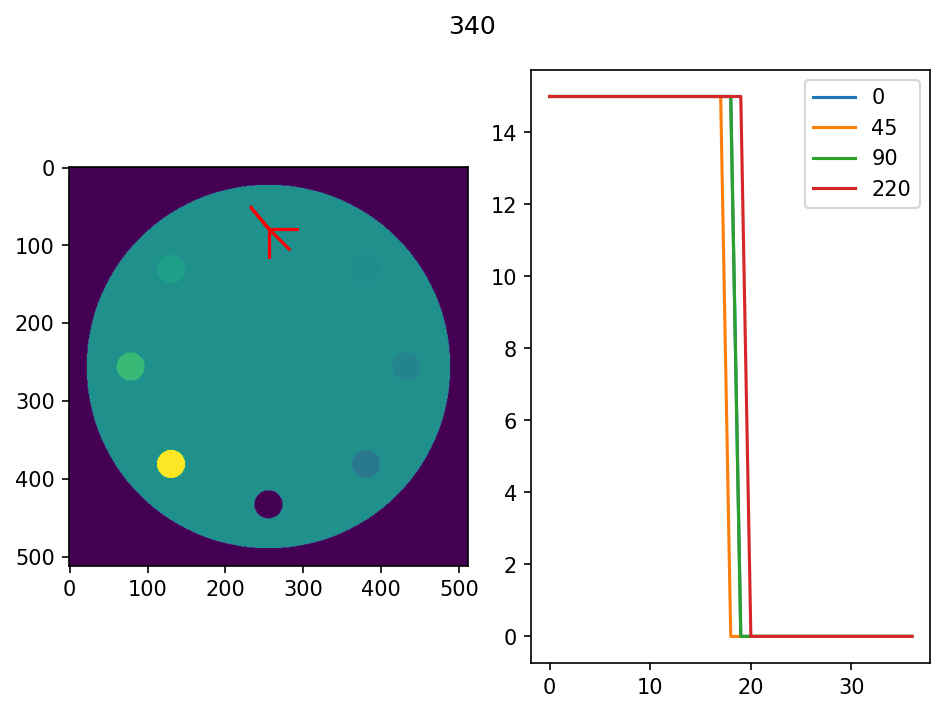

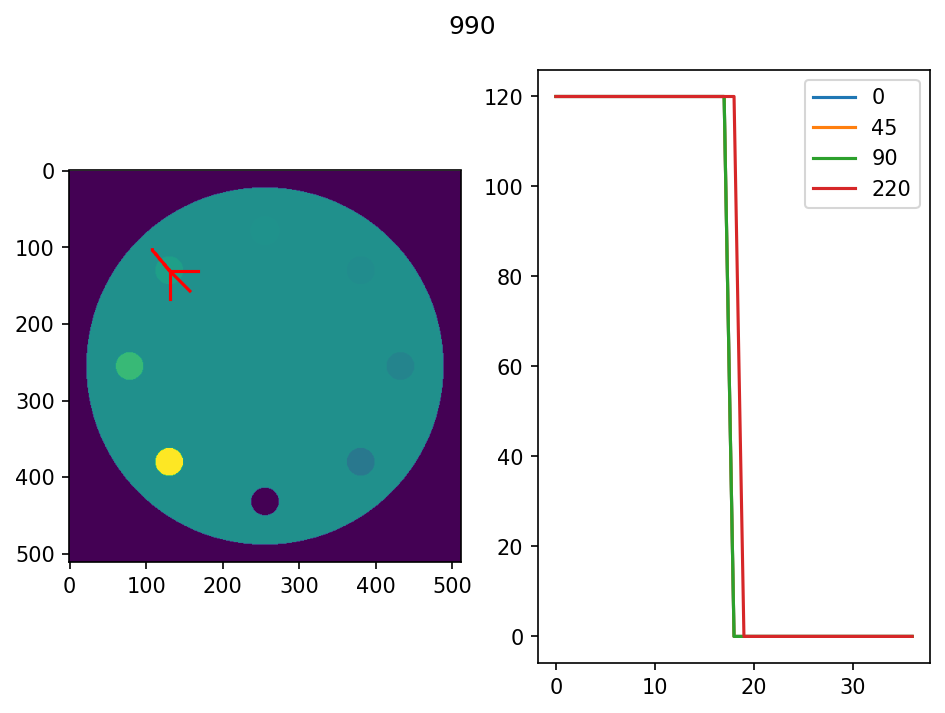

In [28]:
for region in regions:
    contrast = region.label-1000
    if contrast == 0: continue
    f, axs = plt.subplots(1, 2, tight_layout=True, dpi=150)

    for deg in [0, 45, 90, 220]:
        # center = region.centroid
        center = true_centers[contrast]
        radius = np.mean([region.axis_major_length, region.axis_minor_length])/2
        coords = get_radial_coords(gt_img, center, 2*radius, np.deg2rad(deg))
        axs[0].imshow(gt_img)
        axs[0].plot(coords[:, 1], coords[:, 0], color='red', label=deg)

        axs[1].plot(gt_img.flat[np.ravel_multi_index(coords.T, gt_img.shape)], label=deg)
    axs[1].legend()
    f.suptitle(f'{contrast}')
    plt.show()

It seems even with the true center there are still some misalignments due to discrete sampling 

In [29]:
def get_align_profile_shift(p0, ref):
    'aligns p0 to ref'
    p0 = list(p0)
    ref = list(ref)
    shift = np.argmax(abs(np.diff(ref))) - np.argmax(abs(np.diff(p0)))
    return shift

def shift_profile(p0, shift):
    'aligns p0 to ref'
    # print(shift)
    rolled = np.roll(p0, shift)
    if shift > 0:
        rolled[:shift] = p0[0]
        return list(rolled)
    elif shift < 0:
        shift = abs(shift)
        rolled[-shift:] = p0[-1]
        return list(rolled)
    else:
        return p0

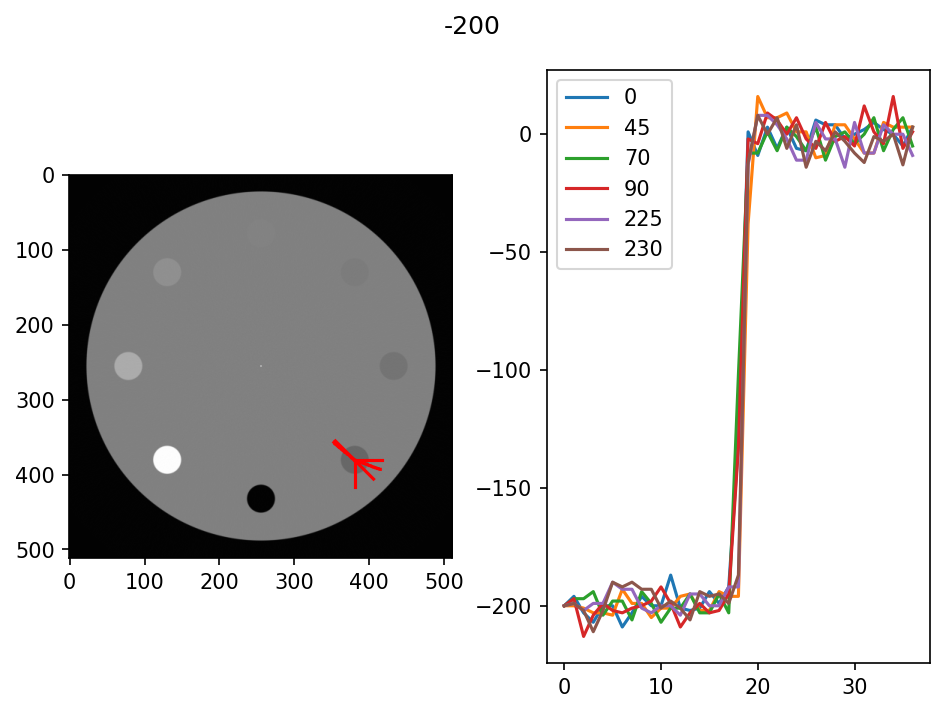

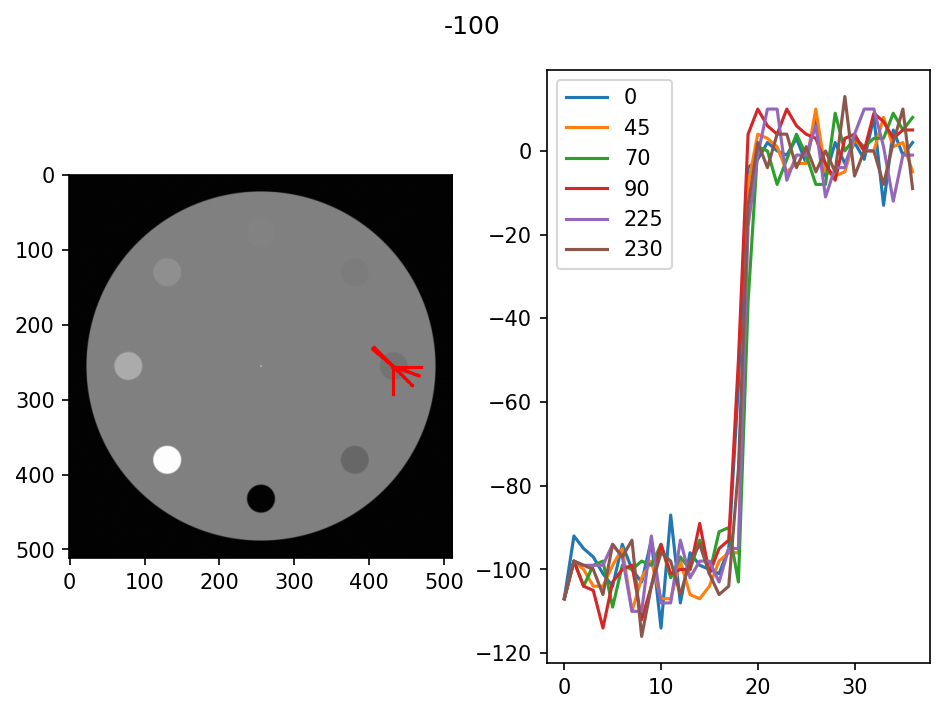

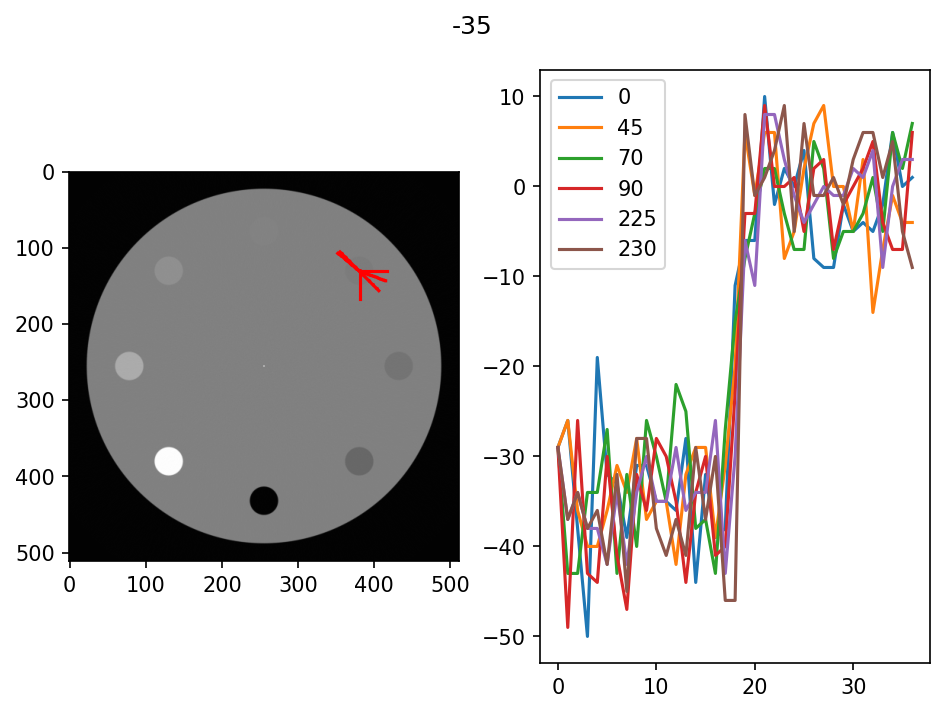

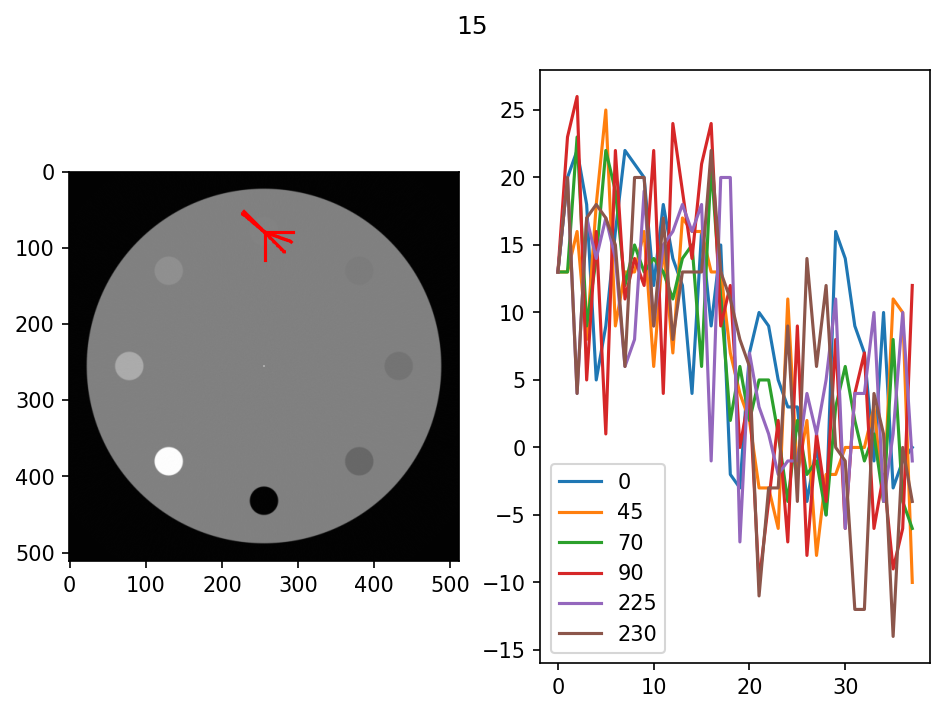

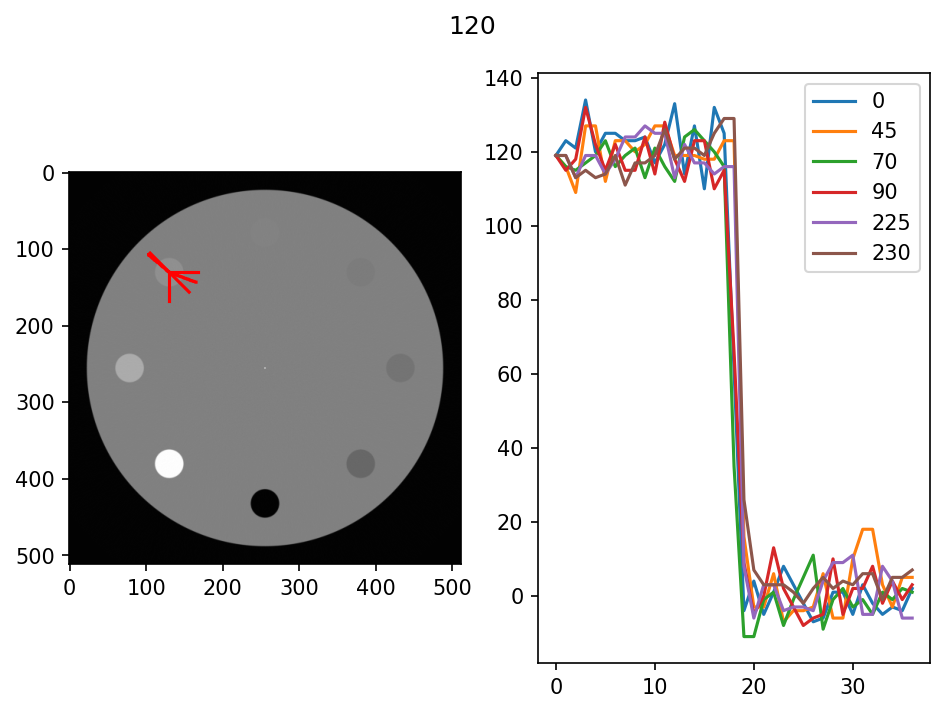

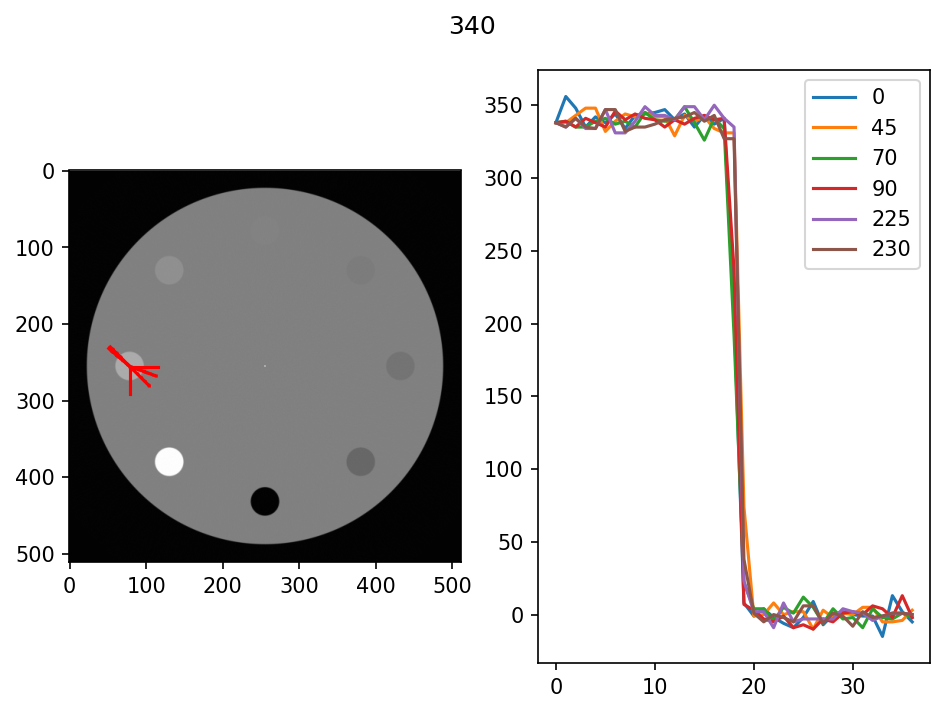

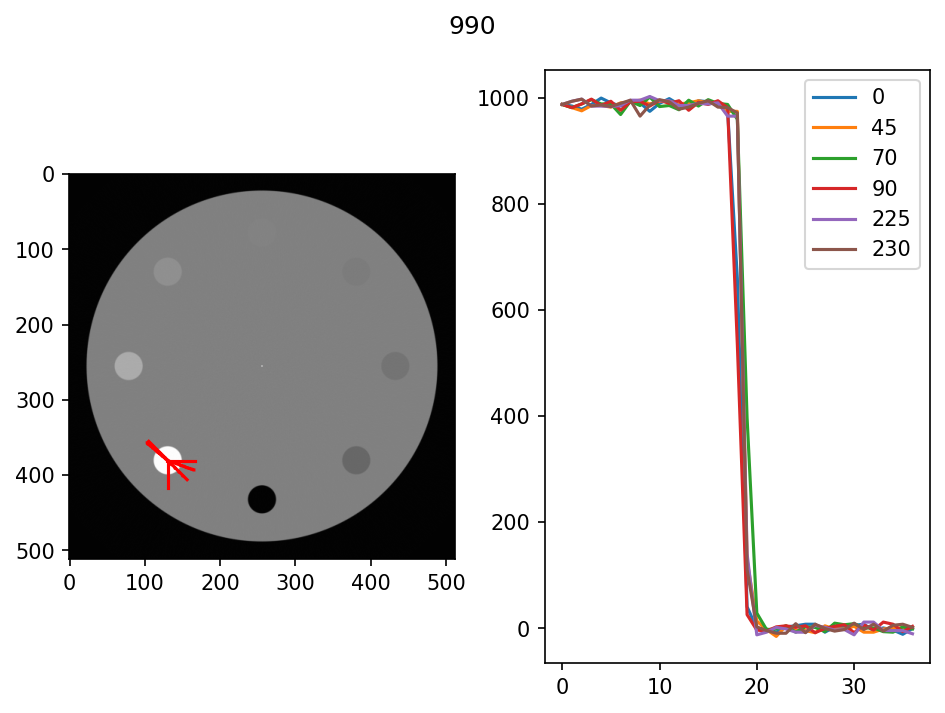

In [30]:
for region in regions:
    contrast = region.label-1000
    if contrast == 0: continue
    f, axs = plt.subplots(1, 2, tight_layout=True, dpi=150)

    for deg in [0, 45, 70, 90, 225, 230]:
        center = region.centroid
        radius = np.mean([region.axis_major_length, region.axis_minor_length])/2
        coords = get_radial_coords(gt_img, center, 2*radius, np.deg2rad(deg))
        axs[0].imshow(img, cmap='gray')
        axs[0].plot(coords[:, 1], coords[:, 0], color='red', label=deg)

        axs[1].plot(img.flat[np.ravel_multi_index(coords.T, gt_img.shape)], label=deg)
    axs[1].legend()
    f.suptitle(f'{contrast}')
    plt.show()

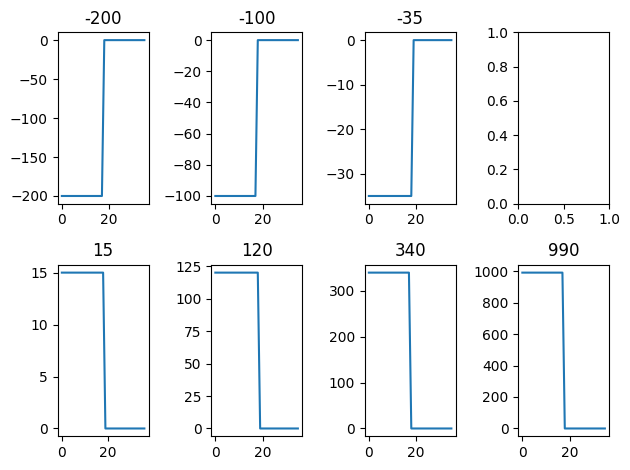

In [31]:
f, axs = plt.subplots(2, 4, tight_layout=True)
for ax, region in zip(axs.flatten(), regions):
    center = region.centroid
    contrast = region.label-1000
    if contrast == 0: continue
    radius = np.mean([region.axis_major_length, region.axis_minor_length])/2
    x0 = round(center[0])
    x1 = int(x0 + 2*radius)
    y0 = round(center[1])
    y1 = int(y0 + 1)
    ax.plot(gt_img[x0:x1, y0:y1])
    ax.set_title(contrast)

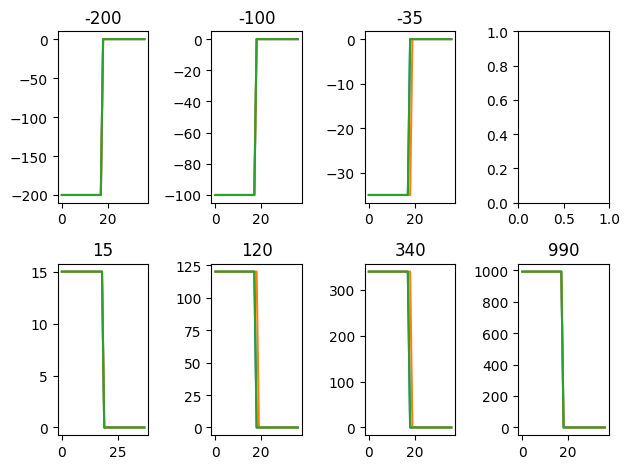

In [32]:
f, axs = plt.subplots(2, 4, tight_layout=True)
for deg in [0, 120, 180]:
    for ax, region in zip(axs.flatten(), regions):
        center = np.array(region.centroid)
        contrast = region.label-1000
        if contrast == 0: continue
        radius = np.mean([region.axis_major_length, region.axis_minor_length])/2
        ax.plot(radial_profile(gt_img, center, 2*radius, angle=np.deg2rad(deg)), label=deg)
        ax.set_title(contrast)
plt.show()

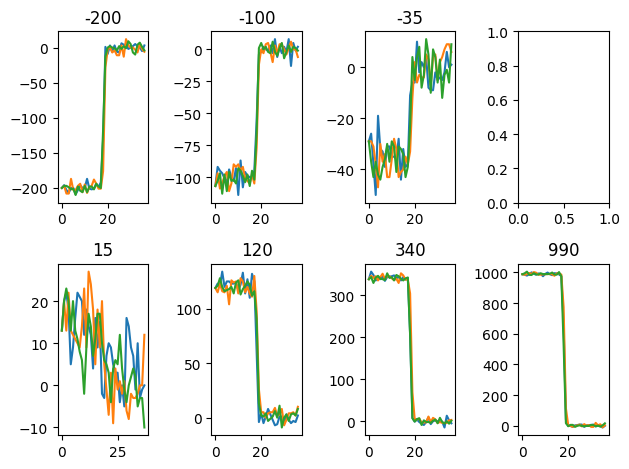

In [33]:
f, axs = plt.subplots(2, 4, tight_layout=True)
for deg in [0, 120, 180]:
    for ax, region in zip(axs.flatten(), regions):
        center = np.array(region.centroid)
        contrast = region.label-1000
        if contrast == 0: continue
        radius = np.mean([region.axis_major_length, region.axis_minor_length])/2
        ax.plot(radial_profile(img, center, 2*radius, angle=np.deg2rad(deg)), label=deg)
        ax.set_title(contrast)
plt.show()

In [34]:
get_align_profile_shift?

Signature: get_align_profile_shift(p0, ref)
Docstring: aligns p0 to ref
File:      /tmp/ipykernel_1216207/1385758228.py
Type:      function

In [35]:
import seaborn as sns

def measure_esf(file, nangles=4):
    """
    Measures edqe spread functions at `nangles` equi-radially spaced for each contrast
    """
    distances = []
    profiles = []
    degrees = []
    contrasts = []
    series = []

    img = load_mhd(file)
    gt_file = get_ground_truth(file)
    gt_img = process_gt(gt_file)

    regions = measure.regionprops(gt_img+1000)
    angles = np.linspace(0, 180, nangles)

    for region in regions:
        contrast = region.label - 1000
        if contrast == 0: continue
        center = region.centroid
        radius = np.mean([region.axis_major_length, region.axis_minor_length])/2
        for deg in angles:
            rad = np.deg2rad(deg)
            new_gt_profile = radial_profile(gt_img, center=center, radius=2*radius, angle=rad)
            if rad == 0:
                gt_profile = new_gt_profile.copy()
            img_profile = list(np.mean([radial_profile(repeat, center=center, radius=2*radius, angle=rad) for repeat in img], axis=0))
            idx = 0
            while gt_profile!=new_gt_profile:
                idx += 1
                if idx > 3:
                    raise RuntimeError(f'Could not align edge after {idx} attempts at angle {deg} degrees')
                    # get_align_profile_shift(p0, ref)
                shift = get_align_profile_shift(new_gt_profile, gt_profile)
                new_gt_profile = shift_profile(new_gt_profile, shift)
                img_profile = shift_profile(img_profile, shift)
   
            gt_profile = new_gt_profile
            
            degrees = degrees + len(gt_profile)*[deg] + len(img_profile)*[deg]
            distances = distances + list(range(len(gt_profile))) + list(range(len(img_profile)))
            profiles = profiles + gt_profile + img_profile
            contrasts = contrasts + len(gt_profile)*[contrast] + len(img_profile)*[contrast]
            series =  series + len(gt_profile)*['truth'] + len(img_profile)*['image']
    esf = pd.DataFrame({'series': series,
                        'contrast': contrasts,
                        'angle [degree]': degrees,
                        'distance': distances,
                        'ESF': profiles})
    return esf

file = meta[meta['Dose [%]']==100].iloc[0].file
esf = measure_esf(file)
esf.head()

,series,contrast,angle [degree],distance,ESF
0,truth,-200,0.0,0,-200.0
1,truth,-200,0.0,1,-200.0
2,truth,-200,0.0,2,-200.0
3,truth,-200,0.0,3,-200.0
4,truth,-200,0.0,4,-200.0


In [36]:
file = meta[meta['Dose [%]']==100].iloc[0].file
nangles = 4
distances = []
profiles = []
degrees = []
contrasts = []
series = []

img = load_mhd(file)
gt_file = get_ground_truth(file)
gt_img = process_gt(gt_file)

regions = measure.regionprops(gt_img+1000)
angles = np.linspace(0, 180, nangles)

for region in regions:
    contrast = region.label - 1000
    if contrast == 0: continue
    center = region.centroid
    radius = np.mean([region.axis_major_length, region.axis_minor_length])/2
    for deg in angles:
        rad = np.deg2rad(deg)
        new_gt_profile = radial_profile(gt_img, center=center, radius=2*radius, angle=rad)
        if rad == 0:
            gt_profile = new_gt_profile.copy()
        img_profile = list(np.mean([radial_profile(repeat, center=center, radius=2*radius, angle=rad) for repeat in img], axis=0))
        idx = 0
        while gt_profile!=new_gt_profile:
            idx += 1
            if idx > 2:
                raise RuntimeError(f'Could not align edge after {idx} attempts at angle {deg} degrees')
                # get_align_profile_shift(p0, ref)
            shift = get_align_profile_shift(new_gt_profile, gt_profile)
            new_gt_profile = shift_profile(new_gt_profile, shift)
            img_profile = shift_profile(img_profile, shift)

        gt_profile = new_gt_profile

        degrees = degrees + len(gt_profile)*[deg] + len(img_profile)*[deg]
        distances = distances + list(range(len(gt_profile))) + list(range(len(img_profile)))
        profiles = profiles + gt_profile + img_profile
        contrasts = contrasts + len(gt_profile)*[contrast] + len(img_profile)*[contrast]
        series =  series + len(gt_profile)*['truth'] + len(img_profile)*['image']
esf = pd.DataFrame({'series': series,
                    'contrast': contrasts,
                    'angle [degree]': degrees,
                    'distance': distances,
                        'ESF': profiles})

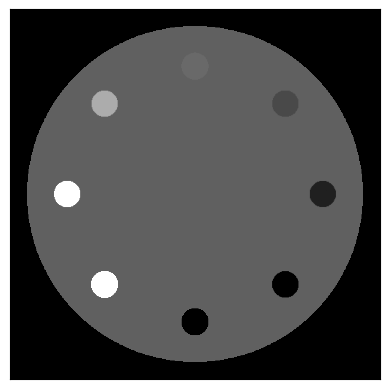

In [37]:
ctshow(gt_img)

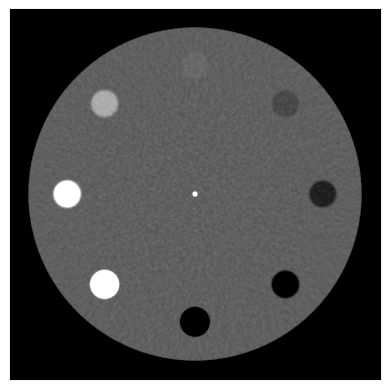

In [38]:
ctshow(img)

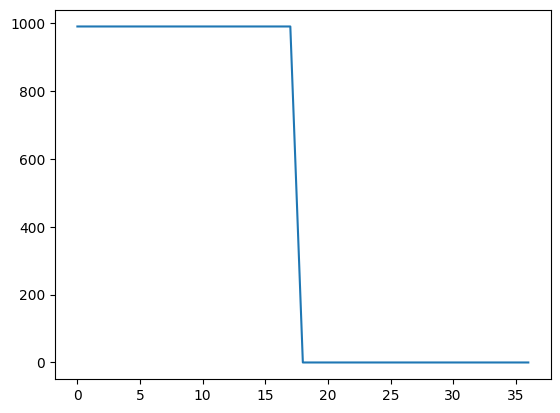

In [39]:
plt.plot(gt_profile)
# plt.plot(new_gt_profile)
plt.show()

In [40]:
esf.contrast.unique()

array([-200, -100,  -35,   15,  120,  340,  990])

In [41]:
[r.label - 1000 for r in regions]

[-200, -100, -35, 0, 15, 120, 340, 990]

In [42]:
esf.contrast.unique()

array([-200, -100,  -35,   15,  120,  340,  990])

<Axes: xlabel='distance', ylabel='ESF'>

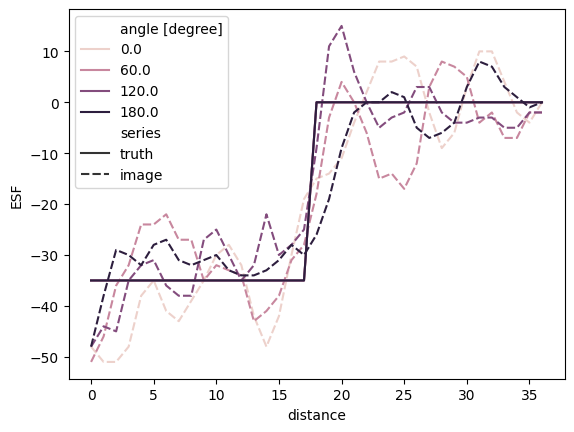

In [43]:
sns.lineplot(data=esf[(esf.contrast==-35)], hue='angle [degree]', x='distance', y='ESF', style='series')

In [44]:
from tqdm import tqdm

df_list = []
for idx, row in tqdm(meta[meta['Dose [%]']==100].iterrows(), total=len(meta[meta['Dose [%]']==100])):
    file = row.file
    esf = measure_esf(file)
    esf['effective diameter [cm]']=row['effective diameter [cm]']
    esf['FOV [cm]']=row['FOV [cm]']
    esf['recon']=row['recon']
    esf.loc[esf['series']=='truth', 'recon'] = 'truth'
    esf['Dose [%]']=row['Dose [%]']
    df_list.append(esf)
esf = pd.concat(df_list, ignore_index=True)
esf

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 480/480 [01:34<00:00,  5.06it/s]


,series,contrast,angle [degree],distance,ESF,effective diameter [cm],FOV [cm],recon,Dose [%]
0,truth,-200,0.0,0,-200.0,11.2,12.3,truth,100.0
1,truth,-200,0.0,1,-200.0,11.2,12.3,truth,100.0
2,truth,-200,0.0,2,-200.0,11.2,12.3,truth,100.0
3,truth,-200,0.0,3,-200.0,11.2,12.3,truth,100.0
4,truth,-200,0.0,4,-200.0,11.2,12.3,truth,100.0
...,...,...,...,...,...,...,...,...,...
934555,image,990,180.0,32,1.0,35.0,38.5,RED-CNN augmented,100.0
934556,image,990,180.0,33,2.0,35.0,38.5,RED-CNN augmented,100.0
934557,image,990,180.0,34,2.0,35.0,38.5,RED-CNN augmented,100.0
934558,image,990,180.0,35,0.0,35.0,38.5,RED-CNN augmented,100.0


In [45]:
measure_esf(file, nangles=3)

,series,contrast,angle [degree],distance,ESF
0,truth,-200,0.0,0,-200.0
1,truth,-200,0.0,1,-200.0
2,truth,-200,0.0,2,-200.0
3,truth,-200,0.0,3,-200.0
4,truth,-200,0.0,4,-200.0
...,...,...,...,...,...
1555,image,990,180.0,32,1.0
1556,image,990,180.0,33,2.0
1557,image,990,180.0,34,2.0
1558,image,990,180.0,35,0.0


In [46]:
esf.recon.unique()

array(['truth', 'fbp', 'RED-CNN', 'RED-CNN augmented'], dtype=object)

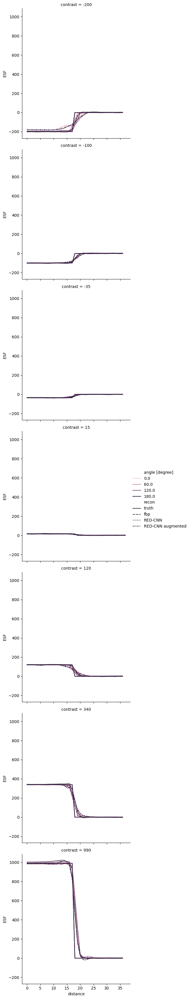

In [47]:
sns.relplot(data=esf[esf['effective diameter [cm]']==15.1], x='distance', y='ESF', hue='angle [degree]', style='recon', kind='line', row='contrast')

### Average across angles

In [48]:
def measure_averaged_esf(file, nangles=180):
    esf = measure_esf(file, nangles=nangles)
    radial_mean_esf = esf.groupby(['series', 'contrast', 'distance']).mean('ESF')
    df_list = []
    for series in esf['series'].unique():
        for contrast in esf['contrast'].unique():
            temp = esf[(esf['series']==series)&(esf['contrast']==contrast)&(esf['angle [degree]']==0)].copy().set_index('distance')
            temp.pop('angle [degree]')
            temp['ESF'] = radial_mean_esf['ESF'][series, contrast]
            df_list.append(temp.reset_index())
    return pd.concat(df_list, ignore_index=True)

In [49]:
avg_esf = measure_averaged_esf(file)
avg_esf

,distance,series,contrast,ESF
0,0,truth,-200,-200.000000
1,1,truth,-200,-200.000000
2,2,truth,-200,-200.000000
3,3,truth,-200,-200.000000
4,4,truth,-200,-200.000000
...,...,...,...,...
515,32,image,990,0.922222
516,33,image,990,0.994444
517,34,image,990,1.061111
518,35,image,990,1.177778


In [50]:
avg_esf[avg_esf.contrast==-100]

,distance,series,contrast,ESF
37,0,truth,-100,-100.000000
38,1,truth,-100,-100.000000
39,2,truth,-100,-100.000000
40,3,truth,-100,-100.000000
41,4,truth,-100,-100.000000
...,...,...,...,...
329,32,image,-100,1.361111
330,33,image,-100,1.083333
331,34,image,-100,1.155556
332,35,image,-100,1.061111


<Axes: xlabel='distance', ylabel='ESF'>

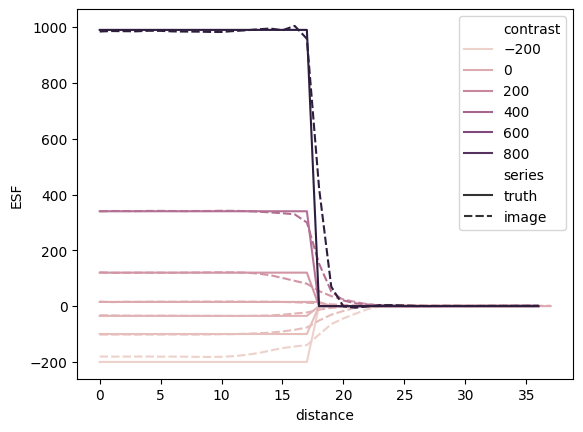

In [51]:
avg_esf = measure_averaged_esf(file, nangles=180)
sns.lineplot(data=avg_esf, x='distance', y='ESF', hue='contrast', style='series')

In [52]:
from tqdm import tqdm
nangles=180

esf_csv = Path('results/esf.csv')

if not esf_csv.exists():
    df_list = []
    for idx, row in tqdm(meta.iterrows()):
        file = row.file
        avg_esf = measure_averaged_esf(file, nangles=180)
        avg_esf['effective diameter [cm]']=row['effective diameter [cm]']
        avg_esf['FOV [cm]']=row['FOV [cm]']
        avg_esf['recon']=row['recon']
        avg_esf.loc[avg_esf['series']=='truth', 'recon'] = 'truth'
        avg_esf['Dose [%]']=row['Dose [%]']
        df_list.append(avg_esf)
    avg_esf = pd.concat(df_list, ignore_index=True)
    avg_esf['distance [cm]'] = avg_esf['distance'] * avg_esf['FOV [cm]']/512
    avg_esf.rename(columns={'distance':'distance [pixels]'})
    avg_esf.to_csv(esf_csv, index=False)

avg_esf = pd.read_csv(esf_csv)
avg_esf

,distance,series,contrast,ESF,effective diameter [cm],FOV [cm],recon,Dose [%],distance [cm]
0,0,truth,-200,-200.000000,35.0,38.5,truth,10,0.000000
1,1,truth,-200,-200.000000,35.0,38.5,truth,10,0.075195
2,2,truth,-200,-200.000000,35.0,38.5,truth,10,0.150391
3,3,truth,-200,-200.000000,35.0,38.5,truth,10,0.225586
4,4,truth,-200,-200.000000,35.0,38.5,truth,10,0.300781
...,...,...,...,...,...,...,...,...,...
93067,32,image,990,0.428056,15.1,16.6,fbp,85,1.037500
93068,33,image,990,0.459722,15.1,16.6,fbp,85,1.069922
93069,34,image,990,0.150556,15.1,16.6,fbp,85,1.102344
93070,35,image,990,-0.206667,15.1,16.6,fbp,85,1.134766


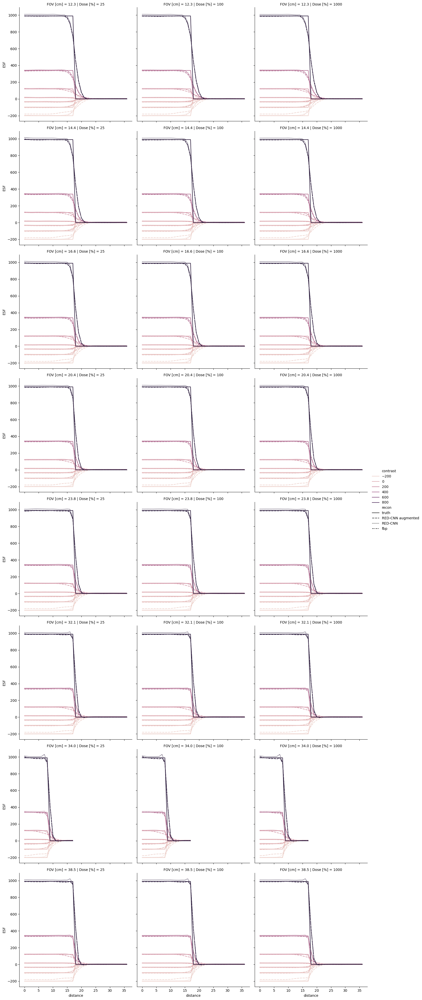

In [53]:
sns.relplot(data=avg_esf[avg_esf['Dose [%]'].isin([25, 100, 1000])], x='distance', y='ESF', hue='contrast', style='recon', kind='line', row='FOV [cm]', col='Dose [%]')

In [54]:
avg_esf['effective diameter [cm]'].unique()

array([35. , 15. , 11.2, 18.5, 21.6, 13.1, 29.2, 15.1])

In [55]:
avg_esf.contrast.unique()

array([-200, -100,  -35,   15,  120,  340,  990])

Text(0, 0.5, 'CT Number [HU]')

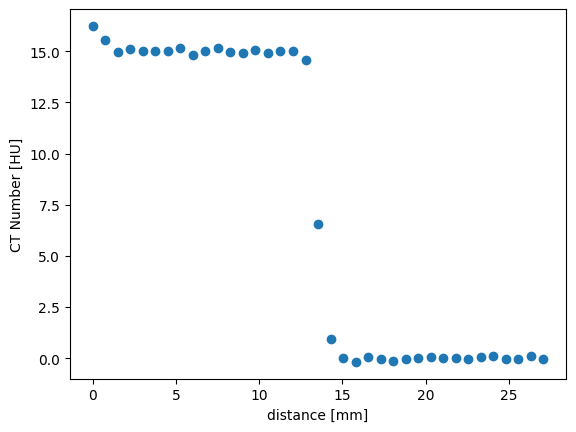

In [56]:
# avg_esf.pop('series')

esf = avg_esf[(avg_esf['contrast']==15)&(avg_esf['effective diameter [cm]']==35)&(avg_esf['recon']=='fbp')&(avg_esf['Dose [%]']==1000)].drop_duplicates()
esf = avg_esf[(avg_esf['contrast']==15)&(avg_esf['effective diameter [cm]']==35)&(avg_esf['recon']=='fbp')&(avg_esf['Dose [%]']==1000)]

pixel_size_mm = esf['FOV [cm]'].iloc[0]/512 * 10
distance = esf['distance'].to_numpy()
distance_mm = esf['distance [cm]'].to_numpy() * 10
esf_profile = esf['ESF'].to_numpy()
plt.scatter(distance_mm, esf_profile)
plt.xlabel('distance [mm]')
plt.ylabel('CT Number [HU]')

In [57]:
from scipy import interpolate
sub_vox_sz = 0.01
interpolator_pix = interpolate.interp1d(distance, esf_profile)
interpolator = interpolate.interp1d(distance_mm, esf_profile)
oversampled_distance_mm = np.arange(distance_mm.min(), distance_mm.max(), step=sub_vox_sz)
oversampled_distance_pix = np.linspace(distance.min(), distance.max(), num=len(oversampled_distance_mm))

oversampled_esf = interpolator(oversampled_distance_mm)

Text(0, 0.5, 'CT Number [HU]')

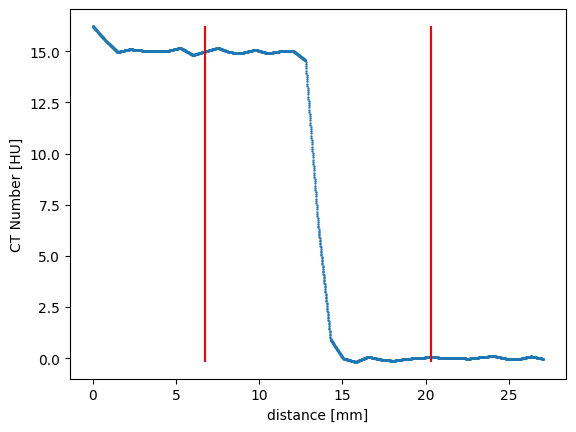

In [58]:
rel_dist_from_ends_for_means = 0.25 # larger number includes more values but risks getting to close to the edge
plt.scatter(oversampled_distance_mm, oversampled_esf, s=0.5)
plt.vlines(oversampled_distance_mm[round(len(oversampled_distance_mm)*rel_dist_from_ends_for_means)], ymin=oversampled_esf.min(), ymax=oversampled_esf.max(), color='red')
plt.vlines(oversampled_distance_mm[round(-len(oversampled_esf)*rel_dist_from_ends_for_means)], ymin=oversampled_esf.min(), ymax=oversampled_esf.max(), color='red')
plt.xlabel('distance [mm]')
plt.ylabel('CT Number [HU]')

To get the mean signal and background values average the values outside of the red lines, (equal to step 3 in [Friedman 2013](https://onlinelibrary.wiley.com/doi/abs/10.1118/1.4800795))

Now normalize so signal = 1 and background = 0 (still step 3)

0.024554640829256187 15.13338332730129


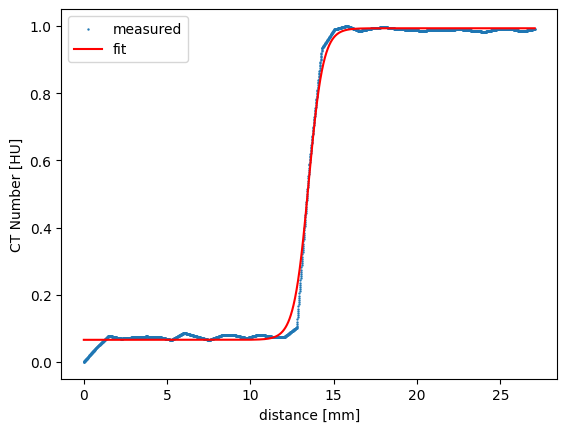

In [59]:
rel_dist_from_ends_for_means = 0.25 # larger number includes more values but risks getting to close to the edge
oversampled_esf = interpolator(oversampled_distance_mm)
mean_signal = oversampled_esf[:round(len(oversampled_distance_mm)*rel_dist_from_ends_for_means)].mean()
mean_bkg = oversampled_esf[round(-len(oversampled_esf)*rel_dist_from_ends_for_means):-1].mean()

oversampled_esf = (oversampled_esf - oversampled_esf.min())/(oversampled_esf.max() - oversampled_esf.min()) #eq. 4 Friedman 2013
# oversampled_esf = 1 - (mean_bkg - oversampled_esf)/(mean_bkg - mean_signal)
print(mean_bkg, mean_signal)
if mean_bkg < mean_signal:
    oversampled_esf= 1 - oversampled_esf
from scipy.optimize import curve_fit
def sigmoid(x, a, b, c, d):
    return a + (b - a)/(1+10**(c-x)*d)
popt, pcov = curve_fit(sigmoid, oversampled_distance_mm, oversampled_esf)
esf_fit = sigmoid(oversampled_distance_mm, *popt)

plt.scatter(oversampled_distance_mm, oversampled_esf, s=0.5, label='measured')
plt.plot(oversampled_distance_mm, esf_fit,label='fit', color='red')
plt.xlabel('distance [mm]')
plt.ylabel('CT Number [HU]')
plt.legend()
plt.show()

esf_profileke the derivative and apply a Hann window

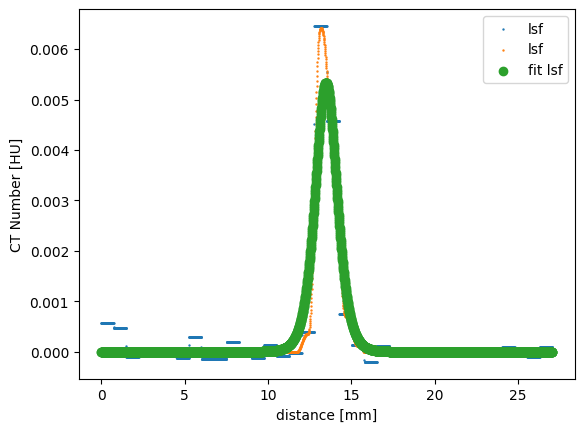

In [60]:
rel_hann_width = 0.03

# plt.scatter(oversampled_distance_mm, oversampled_esf, s=0.5, label='esf')
from scipy import signal
lsf = np.diff(oversampled_esf)

hann_width = round(len(lsf)*rel_hann_width)
win = signal.windows.hann(hann_width)
filtered_lsf = signal.convolve(lsf, win, mode='same') / sum(win)
filtered_lsf *= signal.windows.hann(len(filtered_lsf))**4
filtered_lsf[:round(len(oversampled_distance_mm)*rel_dist_from_ends_for_means)]=0
filtered_lsf[-round(len(oversampled_distance_mm)*rel_dist_from_ends_for_means):]=0
filtered_lsf[filtered_lsf<0]=0
plt.xlabel('distance [mm]')
plt.ylabel('CT Number [HU]')
plt.scatter(oversampled_distance_mm[:-1], lsf, s=0.5, label='lsf')
plt.scatter(oversampled_distance_mm[:-1], filtered_lsf, s=0.5, label='lsf')
plt.scatter(oversampled_distance_mm[:-1],  np.diff(esf_fit), label='fit lsf')
plt.legend()

**Get spatial frequencies for both pixels and mm and save both to dataframes**

In [61]:
def distance_to_spatial_frequencies(distance_array):
    delta_freq = 1/distance_array.max()
    max_freq = 1/np.diff(distance_array)[0]
    sampled_freq = np.arange(0, max_freq, delta_freq)
    return sampled_freq

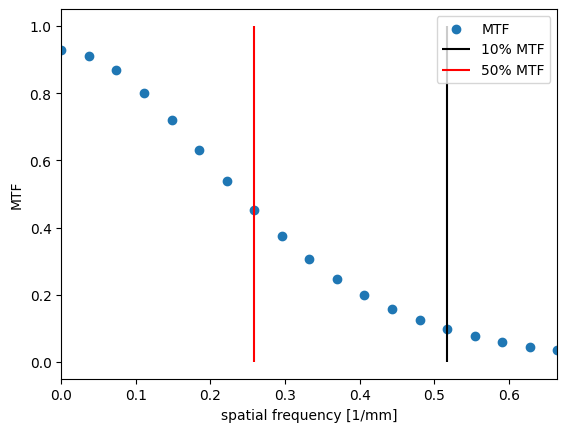

In [62]:
freq_invmm = distance_to_spatial_frequencies(oversampled_distance_mm)
freq_invpx = distance_to_spatial_frequencies(oversampled_distance_pix)
cutoff_freq = 1/pixel_size_mm/2 #nyquist freq
# mtf = np.abs(np.fft.fft(filtered_lsf))
mtf = np.abs(np.fft.fft(np.diff(esf_fit)))


if len(mtf)<len(freq_invmm):
    mtf = np.append(mtf, 0)

plt.scatter(freq_invmm, mtf, label='MTF')
plt.vlines(freq_invmm[np.argwhere(mtf<0.1)[0]], ymin=0, ymax=1, label='10% MTF', color='black')
plt.vlines(freq_invmm[np.argwhere(mtf<0.5)[0]], ymin=0, ymax=1, label='50% MTF', color='red')
plt.xlim([0, cutoff_freq])
plt.xlabel('spatial frequency [1/mm]')
plt.ylabel('MTF')
plt.legend()

https://onlinelibrary.wiley.com/doi/abs/10.1118/1.4800795 see on MTF

package into function

In [63]:
cutoff_freq_idx=np.argwhere(freq_invmm > cutoff_freq).squeeze()[0]
mtf_df = pd.DataFrame({'spatial frequency [1/mm]': freq_invmm[:cutoff_freq_idx],
                       'spatial frequency [1/px]': freq_invpx[:cutoff_freq_idx],
                       'MTF': mtf[:cutoff_freq_idx]})
mtf_df.head()

,spatial frequency [1/mm],spatial frequency [1/px],MTF
0,0.000000,0.000000,0.927249
1,0.036941,0.027778,0.911930
2,0.073883,0.055556,0.868037
3,0.110824,0.083333,0.801168
4,0.147765,0.111111,0.718945


Now add columns for FOV, diameter, recon, dose and append all...

<Axes: xlabel='spatial frequency [1/px]'>

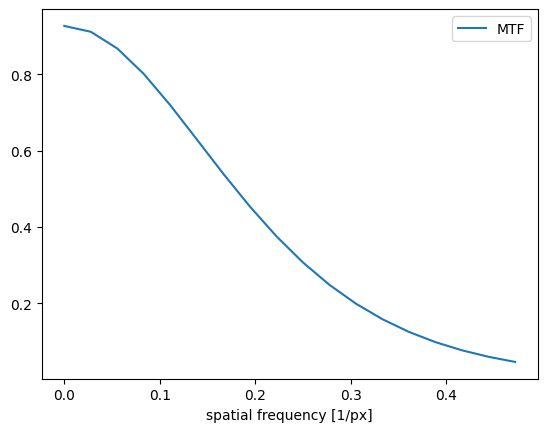

In [64]:
mtf_df.plot(x='spatial frequency [1/px]', y='MTF')

In [65]:
from scipy import interpolate, signal
from scipy.optimize import curve_fit
from results_utils import sigmoid, measure_mtf


In [66]:
avg_esf['contrast'].unique()

array([-200, -100,  -35,   15,  120,  340,  990])

The negative values are good, but there's something up with the 15. 120. 340, 990 not have MTF 1 at 0 freq

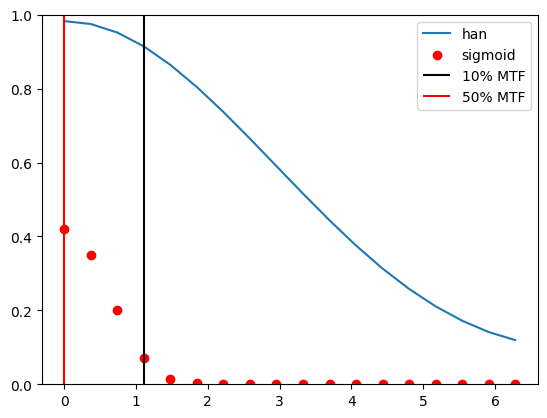

In [67]:
esf = avg_esf[(avg_esf['contrast']==-100)&(avg_esf['effective diameter [cm]']==35)&(avg_esf['recon']=='fbp')&(avg_esf['Dose [%]']==1000)]
distance = esf['distance [cm]'].to_numpy()
esf_profile = esf['ESF'].to_numpy()

m, f = measure_mtf(esf_profile, distance=distance, sigmoid_fit=False)
plt.plot(f, m, label='han')
m, f = measure_mtf(esf_profile, distance=distance, sigmoid_fit=True)
plt.scatter(f, m, label='sigmoid', color='red')
if (m<0.1).any():
    plt.vlines(f[np.argwhere(m<0.1)[0]], ymin=0, ymax=1, label='10% MTF', color='black')
plt.vlines(f[np.argwhere(m<0.5)[0]], ymin=0, ymax=1, label='50% MTF', color='red')
plt.legend()
plt.ylim([0, 1])
plt.show()

Double check ground truth as this should be 1 or close

TODO: make unique labels for each line profile so they are easier to select eg: 15 cm fbp dose 100 80 contrast (or a integer id)

In [68]:
from results_utils import make_mtf_df

mtf_df = make_mtf_df(avg_esf, sigmoid_fit=False)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:03<00:00,  2.40it/s]


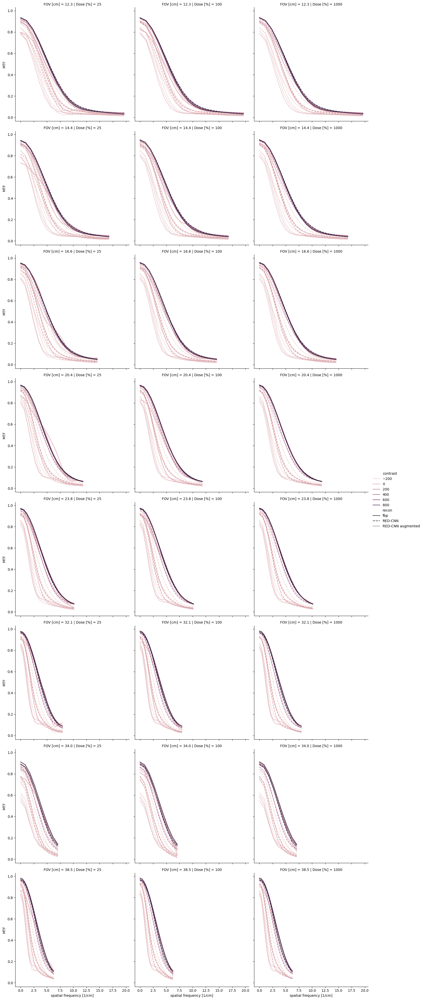

In [69]:
sns.relplot(data=mtf_df[mtf_df['Dose [%]'].isin([25, 100, 1000])], x='spatial frequency [1/cm]', y='MTF', hue='contrast', style='recon', style_order=['fbp', 'RED-CNN', 'RED-CNN augmented'], kind='line', row='FOV [cm]', col='Dose [%]')

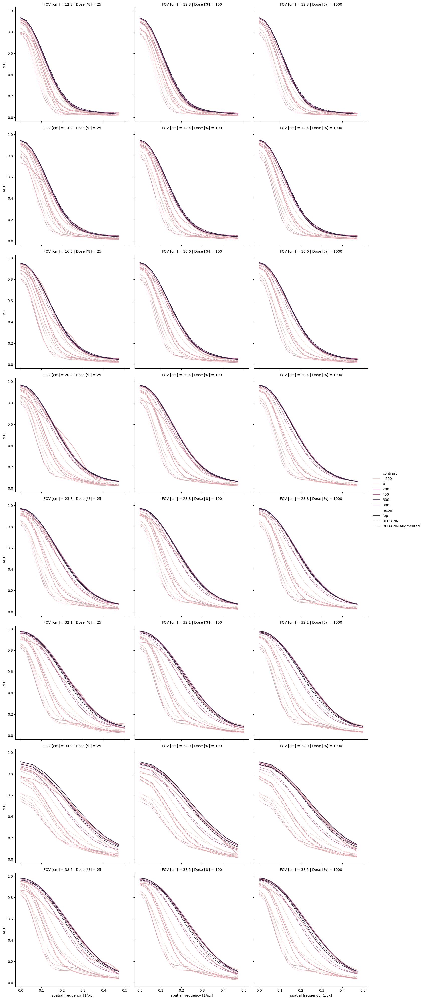

In [70]:
sns.relplot(data=mtf_df[mtf_df['Dose [%]'].isin([25, 100, 1000])], x='spatial frequency [1/px]', y='MTF', hue='contrast', style='recon', style_order=['fbp', 'RED-CNN', 'RED-CNN augmented'], kind='line', row='FOV [cm]', col='Dose [%]')

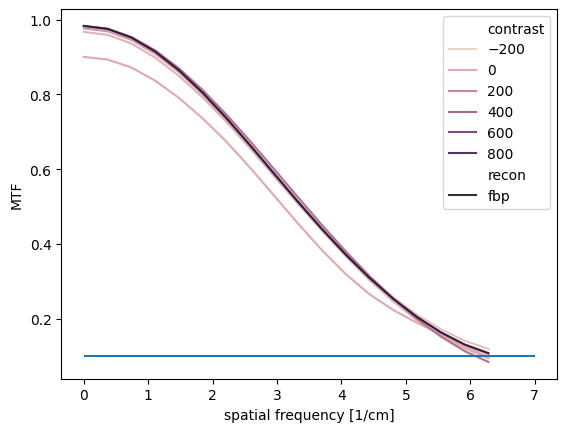

In [71]:
from utils import pediatric_subgroup
mtf_df['pediatric subgroup'] = mtf_df['effective diameter [cm]'].apply(pediatric_subgroup)
f, ax = plt.subplots()
sns.lineplot(data=mtf_df[mtf_df['Dose [%]'].isin([1000]) & (mtf_df['pediatric subgroup']=='adult') & (mtf_df.recon=='fbp')], x='spatial frequency [1/cm]', y='MTF', hue='contrast', style='recon', ax=ax)
ax.hlines(y=0.1, xmin=0, xmax=7)

This looks pretty good thought the dip in the ground truth is a little strange, it could be because some of the angles in the radial profile have profiles that are misaligned that is blurring the average, but all together the trends are as expected

<Axes: xlabel='spatial frequency [1/cm]'>

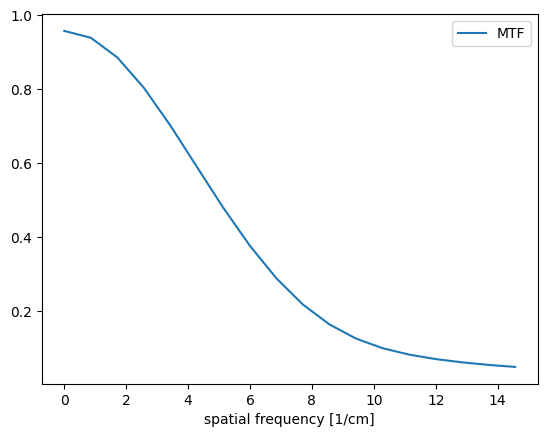

In [72]:
names = mtf_df.name.unique()
name = names[-1]
mtf_df[mtf_df.name == name].plot(x='spatial frequency [1/cm]', y='MTF')

In [73]:
mtf_df[mtf_df.recon=='truth']

,name,effective diameter [cm],FOV [cm],Dose [%],recon,contrast,spatial frequency [1/cm],spatial frequency [1/px],MTF,pediatric subgroup
0,35.0 cm 10% dose truth -200 HU,35.0,38.5,10,truth,-200,0.000000,0.000000,0.988828,adult
1,35.0 cm 10% dose truth -200 HU,35.0,38.5,10,truth,-200,0.369408,0.027778,0.987026,adult
2,35.0 cm 10% dose truth -200 HU,35.0,38.5,10,truth,-200,0.738817,0.055556,0.981637,adult
3,35.0 cm 10% dose truth -200 HU,35.0,38.5,10,truth,-200,1.108225,0.083333,0.972706,adult
4,35.0 cm 10% dose truth -200 HU,35.0,38.5,10,truth,-200,1.477633,0.111111,0.960310,adult
...,...,...,...,...,...,...,...,...,...,...
30081,15.1 cm 85% dose truth 990 HU,15.1,16.6,85,truth,990,11.137885,0.361111,0.718811,newborn
30082,15.1 cm 85% dose truth 990 HU,15.1,16.6,85,truth,990,11.994645,0.388889,0.681605,newborn
30083,15.1 cm 85% dose truth 990 HU,15.1,16.6,85,truth,990,12.851406,0.416667,0.643300,newborn
30084,15.1 cm 85% dose truth 990 HU,15.1,16.6,85,truth,990,13.708166,0.444444,0.604182,newborn


In [74]:
set_NA_to_min = True
for name in mtf_df.name.unique():
    mtf = mtf_df[(mtf_df.name == name)]['MTF']
    if mtf.min() < 0.5:
        mtf_df.loc[mtf_df.name == name, 'MTF 50% [1/cm]'] = mtf_df[(mtf_df.name == name)&(mtf_df['MTF']<0.5)].iloc[0]['spatial frequency [1/cm]']
        mtf_df.loc[mtf_df.name == name, 'MTF 50% [1/px]'] = mtf_df[(mtf_df.name == name)&(mtf_df['MTF']<0.5)].iloc[0]['spatial frequency [1/px]']
    if mtf.min() < 0.1:
        mtf_df.loc[mtf_df.name == name, 'MTF 10% [1/cm]'] = mtf_df[(mtf_df.name == name)&(mtf_df['MTF']<0.1)].iloc[0]['spatial frequency [1/cm]']
        mtf_df.loc[mtf_df.name == name, 'MTF 10% [1/px]'] = mtf_df[(mtf_df.name == name)&(mtf_df['MTF']<0.1)].iloc[0]['spatial frequency [1/px]']
    
    if set_NA_to_min:
       # WARNING these are not exactly the 50 and 10% values, but just take the lowest if those aren't available, need to figure out how to handle this later
        if mtf.min() > 0.5:
            mtf_df.loc[mtf_df.name == name, 'MTF 50% [1/cm]'] = mtf_df[(mtf_df.name == name)].iloc[-1]['spatial frequency [1/cm]']
            mtf_df.loc[mtf_df.name == name, 'MTF 50% [1/px]'] = mtf_df[(mtf_df.name == name)].iloc[-1]['spatial frequency [1/px]']
        if mtf.min() > 0.1:
            mtf_df.loc[mtf_df.name == name, 'MTF 10% [1/cm]'] = mtf_df[(mtf_df.name == name)].iloc[-1]['spatial frequency [1/cm]']
            mtf_df.loc[mtf_df.name == name, 'MTF 10% [1/px]'] = mtf_df[(mtf_df.name == name)].iloc[-1]['spatial frequency [1/px]']
mtf_df

,name,effective diameter [cm],FOV [cm],Dose [%],recon,contrast,spatial frequency [1/cm],spatial frequency [1/px],MTF,pediatric subgroup,MTF 50% [1/cm],MTF 50% [1/px],MTF 10% [1/cm],MTF 10% [1/px]
0,35.0 cm 10% dose truth -200 HU,35.0,38.5,10,truth,-200,0.000000,0.000000,0.988828,adult,6.279942,0.472222,6.279942,0.472222
1,35.0 cm 10% dose truth -200 HU,35.0,38.5,10,truth,-200,0.369408,0.027778,0.987026,adult,6.279942,0.472222,6.279942,0.472222
2,35.0 cm 10% dose truth -200 HU,35.0,38.5,10,truth,-200,0.738817,0.055556,0.981637,adult,6.279942,0.472222,6.279942,0.472222
3,35.0 cm 10% dose truth -200 HU,35.0,38.5,10,truth,-200,1.108225,0.083333,0.972706,adult,6.279942,0.472222,6.279942,0.472222
4,35.0 cm 10% dose truth -200 HU,35.0,38.5,10,truth,-200,1.477633,0.111111,0.960310,adult,6.279942,0.472222,6.279942,0.472222
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30459,15.1 cm 85% dose fbp 990 HU,15.1,16.6,85,fbp,990,11.137885,0.361111,0.081124,newborn,5.140562,0.166667,10.281124,0.333333
30460,15.1 cm 85% dose fbp 990 HU,15.1,16.6,85,fbp,990,11.994645,0.388889,0.069061,newborn,5.140562,0.166667,10.281124,0.333333
30461,15.1 cm 85% dose fbp 990 HU,15.1,16.6,85,fbp,990,12.851406,0.416667,0.060166,newborn,5.140562,0.166667,10.281124,0.333333
30462,15.1 cm 85% dose fbp 990 HU,15.1,16.6,85,fbp,990,13.708166,0.444444,0.053242,newborn,5.140562,0.166667,10.281124,0.333333


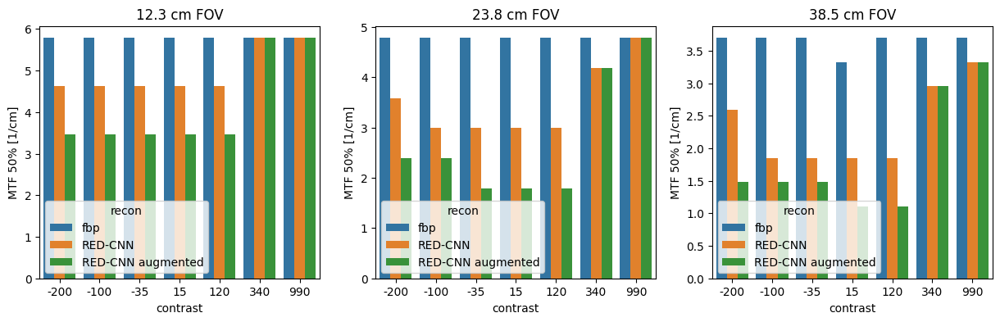

In [75]:
f, axs = plt.subplots(1,3, figsize=(15, 4))
for ax, fov in zip(axs.flatten(), [12.3, 23.8, 38.5]):
    sns.barplot(ax=ax, data=mtf_df[(mtf_df['Dose [%]']==1000)&(mtf_df['FOV [cm]']==fov)], x='contrast', y='MTF 50% [1/cm]', hue='recon', hue_order=['fbp', 'RED-CNN', 'RED-CNN augmented'])
    ax.set_title(f'{fov} cm FOV')

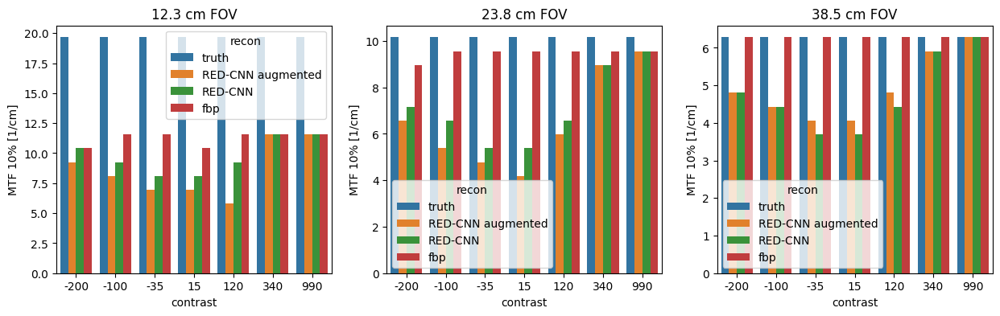

In [76]:
f, axs = plt.subplots(1,3, figsize=(15, 4))
for ax, fov in zip(axs.flatten(), [12.3, 23.8, 38.5]):
    sns.barplot(ax=ax, data=mtf_df[(mtf_df['Dose [%]']==1000)&(mtf_df['FOV [cm]']==fov)], x='contrast', y='MTF 10% [1/cm]', hue='recon')
    ax.set_title(f'{fov} cm FOV')

In [77]:
from utils import pediatric_subgroup
mtf_df['pediatric subgroup'] = mtf_df['effective diameter [cm]'].apply(pediatric_subgroup)

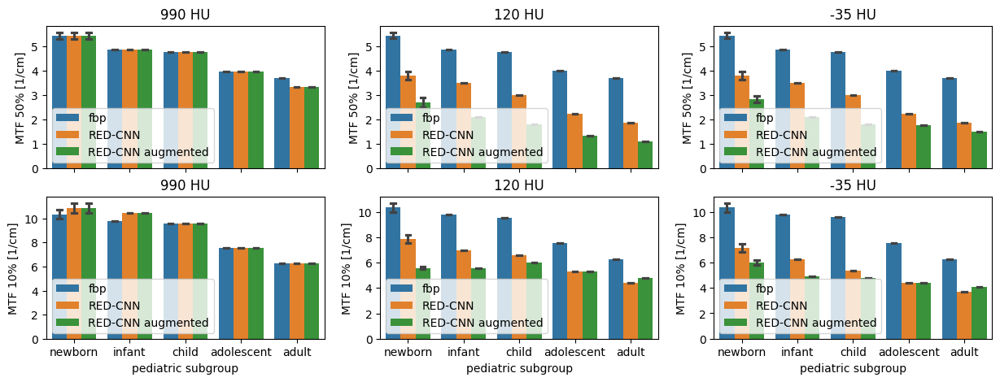

In [78]:
f, axs = plt.subplots(2,3, figsize=(15, 5), sharex=True)

for row, mtf_cutoff in enumerate([50, 10]):
    for col, contrast in enumerate([990, 120, -35]):
        sns.barplot(ax=axs[row, col], data=mtf_df[(mtf_df['Dose [%]']==1000)&(mtf_df['contrast']==contrast)], x='pediatric subgroup', y=f'MTF {mtf_cutoff}% [1/cm]', hue='recon', hue_order=['fbp', 'RED-CNN', 'RED-CNN augmented'], order=['newborn', 'infant', 'child', 'adolescent', 'adult'], capsize=0.25)
        axs[row, col].set_title(f'{contrast} HU')
        axs[row, col].legend(loc='lower left')

In [79]:
mtf_df = mtf_df.copy()
cols = ['effective diameter [cm]', 'Dose [%]', 'contrast']
means = mtf_df.groupby(cols).mean('MTF 50% [1/cm]')

In [80]:
means

FOV [cm]  spatial frequency [1/cm]  \
effective diameter [cm] Dose [%] contrast                                       
11.2                    10       -200          12.3                  9.828365   
                                 -100          12.3                  9.828365   
                                 -35           12.3                  9.828365   
                                  15           12.3                  9.828365   
                                  120          12.3                  9.828365   
...                                             ...                       ...   
35.0                    1000     -35           38.5                  3.139971   
                                  15           38.5                  3.139971   
                                  120          38.5                  3.139971   
                                  340          38.5                  3.139971   
                                  990          38.5                  3.139971   

                                           spatial frequency [1/px]       MTF  \
effective diameter [cm] Dose [%] contrast                                       
11.2                    10       -200                      0.236111  0.406170   
                                 -100                      0.236111  0.404411   
                                 -35                       0.236111  0.374884   
                                  15                       0.236111  0.392443   
                                  120                      0.236111  0.387384   
...                                                             ...       ...   
35.0                    1000     -35                       0.236111  0.483400   
                                  15                       0.236111  0.469048   
                                  120                      0.236111  0.492185   
                                  340                      0.236111  0.589152   
                                  990                      0.236111  0.612740   

                                           MTF 50% [1/cm]  MTF 50% [1/px]  \
effective diameter [cm] Dose [%] contrast                                   
11.2                    10       -200            8.672087        0.208333   
                                 -100            8.383017        0.201389   
                                 -35             8.093948        0.194444   
                                  15             8.672087        0.208333   
                                  120            8.383017        0.201389   
...                                                   ...             ...   
35.0                    1000     -35             3.324675        0.250000   
                                  15             3.139971        0.236111   
                                  120            3.232323        0.243056   
                                  340            3.971140        0.298611   
                                  990            4.155844        0.312500   

                                           MTF 10% [1/cm]  MTF 10% [1/px]  
effective diameter [cm] Dose [%] contrast                                  
11.2                    10       -200           12.429991        0.298611  
                                 -100           11.851852        0.284722  
                                 -35            11.273713        0.270833  
                                  15            12.429991        0.298611  
                                  120           11.562782        0.277778  
...                                                   ...             ...  
35.0                    1000     -35             5.079365        0.381944  
                                  15             5.079365        0.381944  
                                  120            5.448773        0.409722  
                                  340            6.095238        0.458333  
                     

In [81]:
from tqdm import tqdm
def measure_relative_mtf(mtf_df):
    mtf_df = mtf_df.copy()
    cols = ['effective diameter [cm]', 'Dose [%]', 'contrast', 'recon',]
    means = mtf_df.groupby(cols).mean('MTF 50% [1/cm]')

    rows = []
    for idx, row in tqdm(mtf_df.iterrows(), total=len(mtf_df)):
        row_mtf = means['MTF 50% [1/cm]'][row[cols[0]], int(row[cols[1]]), *row[cols[2:]].to_list()]
        fbp_mtf = means['MTF 50% [1/cm]'][row[cols[0]], int(row[cols[1]]), *row[cols[2:-1]].to_list(), 'fbp']
        row['relative MTF 50%'] = row_mtf/fbp_mtf

        row_mtf = means['MTF 10% [1/cm]'][row[cols[0]], int(row[cols[1]]), *row[cols[2:]].to_list()]
        fbp_mtf = means['MTF 10% [1/cm]'][row[cols[0]], int(row[cols[1]]), *row[cols[2:-1]].to_list(), 'fbp']
        row['relative MTF 10%'] = row_mtf/fbp_mtf
        rows.append(pd.DataFrame(row).T)
    return pd.concat(rows)
mtf_df = measure_relative_mtf(mtf_df)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 30464/30464 [00:34<00:00, 885.24it/s]


In [82]:
mtf_df

,name,effective diameter [cm],FOV [cm],Dose [%],recon,contrast,spatial frequency [1/cm],spatial frequency [1/px],MTF,pediatric subgroup,MTF 50% [1/cm],MTF 50% [1/px],MTF 10% [1/cm],MTF 10% [1/px],relative MTF 50%,relative MTF 10%
0,35.0 cm 10% dose truth -200 HU,35.0,38.5,10,truth,-200,0.0,0.0,0.988828,adult,6.279942,0.472222,6.279942,0.472222,1.888889,1.0
1,35.0 cm 10% dose truth -200 HU,35.0,38.5,10,truth,-200,0.369408,0.027778,0.987026,adult,6.279942,0.472222,6.279942,0.472222,1.888889,1.0
2,35.0 cm 10% dose truth -200 HU,35.0,38.5,10,truth,-200,0.738817,0.055556,0.981637,adult,6.279942,0.472222,6.279942,0.472222,1.888889,1.0
3,35.0 cm 10% dose truth -200 HU,35.0,38.5,10,truth,-200,1.108225,0.083333,0.972706,adult,6.279942,0.472222,6.279942,0.472222,1.888889,1.0
4,35.0 cm 10% dose truth -200 HU,35.0,38.5,10,truth,-200,1.477633,0.111111,0.96031,adult,6.279942,0.472222,6.279942,0.472222,1.888889,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30459,15.1 cm 85% dose fbp 990 HU,15.1,16.6,85,fbp,990,11.137885,0.361111,0.081124,newborn,5.140562,0.166667,10.281124,0.333333,1.0,1.0
30460,15.1 cm 85% dose fbp 990 HU,15.1,16.6,85,fbp,990,11.994645,0.388889,0.069061,newborn,5.140562,0.166667,10.281124,0.333333,1.0,1.0
30461,15.1 cm 85% dose fbp 990 HU,15.1,16.6,85,fbp,990,12.851406,0.416667,0.060166,newborn,5.140562,0.166667,10.281124,0.333333,1.0,1.0
30462,15.1 cm 85% dose fbp 990 HU,15.1,16.6,85,fbp,990,13.708166,0.444444,0.053242,newborn,5.140562,0.166667,10.281124,0.333333,1.0,1.0


In [83]:
mtf_df.contrast.unique()

array([-200, -100, -35, 15, 120, 340, 990], dtype=object)

### Figure 7

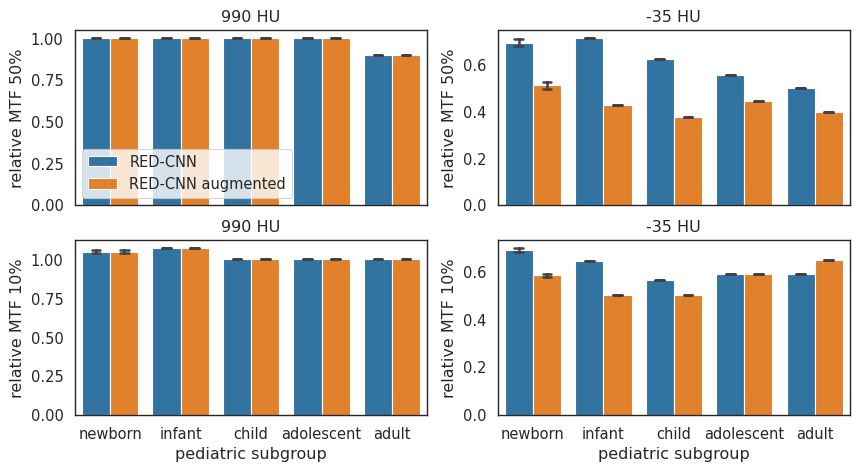

In [84]:
sns.set_context('paper', font_scale=1.2)
sns.set_style('white')
f, axs = plt.subplots(2,2, figsize=(10, 5), sharex=True)
for row, mtf_cutoff in enumerate([50, 10]):
    for col, contrast in enumerate([990, -35]):
        sns.barplot(ax=axs[row, col], data=mtf_df[(mtf_df['Dose [%]']==1000)&(mtf_df['contrast']==contrast)], x='pediatric subgroup', y=f'relative MTF {mtf_cutoff}%', hue='recon', hue_order=['RED-CNN', 'RED-CNN augmented'], order=['newborn', 'infant', 'child', 'adolescent', 'adult'], capsize=0.25)
        axs[row, col].set_title(f'{contrast} HU')
        if (row + col) == 0:
            axs[row, col].legend(loc='lower left')
        else:
            axs[row, col].get_legend().remove()
f.savefig('figures/fig7_image_sharpness.png', dpi=600)

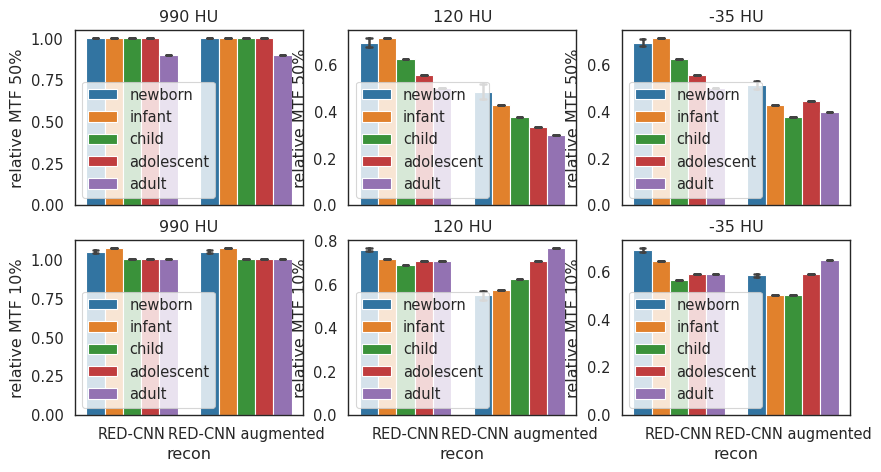

In [85]:
f, axs = plt.subplots(2,3, figsize=(10, 5), sharex=True)

for row, mtf_cutoff in enumerate([50, 10]):
    for col, contrast in enumerate([990, 120, -35]):
        sns.barplot(ax=axs[row, col], data=mtf_df[(mtf_df['Dose [%]']==1000)&(mtf_df['contrast']==contrast)], x='recon', y=f'relative MTF {mtf_cutoff}%', hue='pediatric subgroup', order=['RED-CNN', 'RED-CNN augmented'], hue_order=['newborn', 'infant', 'child', 'adolescent', 'adult'], capsize=0.25)
        axs[row, col].set_title(f'{contrast} HU')
        axs[row, col].legend(loc='lower left')

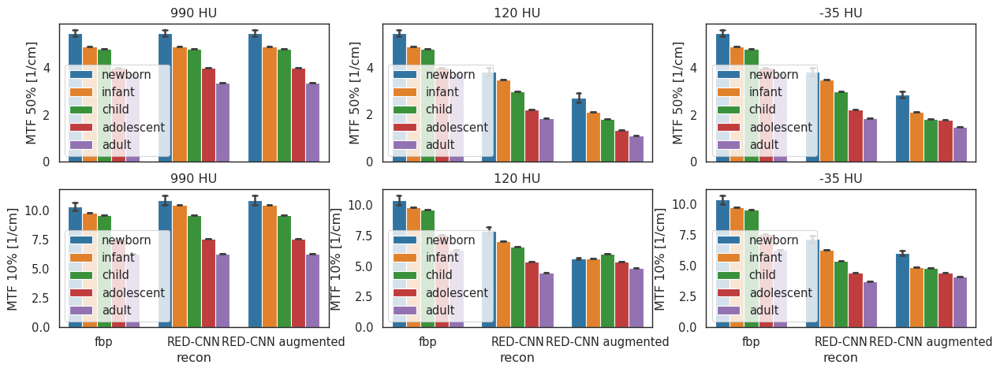

In [86]:
f, axs = plt.subplots(2,3, figsize=(15, 5), sharex=True)

for row, mtf_cutoff in enumerate([50, 10]):
    for col, contrast in enumerate([990, 120, -35]):
        sns.barplot(ax=axs[row, col], data=mtf_df[(mtf_df['Dose [%]']==1000)&(mtf_df['contrast']==contrast)], x='recon', y=f'MTF {mtf_cutoff}% [1/cm]', hue='pediatric subgroup', order=['fbp', 'RED-CNN', 'RED-CNN augmented'], hue_order=['newborn', 'infant', 'child', 'adolescent', 'adult'], capsize=0.25)
        axs[row, col].set_title(f'{contrast} HU')
        axs[row, col].legend(loc='lower left')

Could show with either recon or subgroup on x but I think subgroup makes more sense as its easier to visualize changes

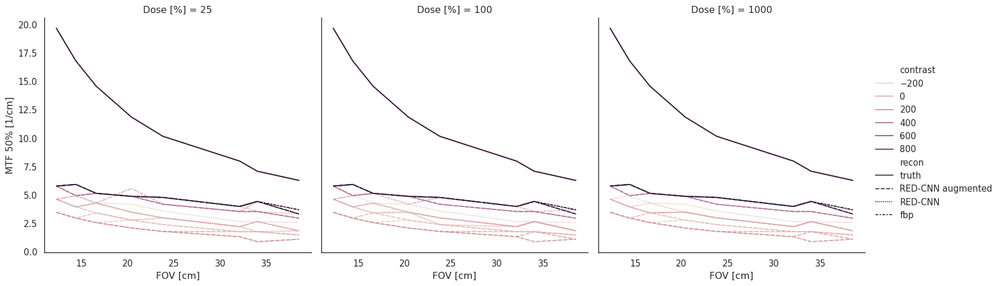

In [87]:
sns.relplot(data=mtf_df[(mtf_df['Dose [%]'].isin([25, 100, 1000]))], x='FOV [cm]', y='MTF 50% [1/cm]', hue='contrast', style='recon', col='Dose [%]', kind='line')

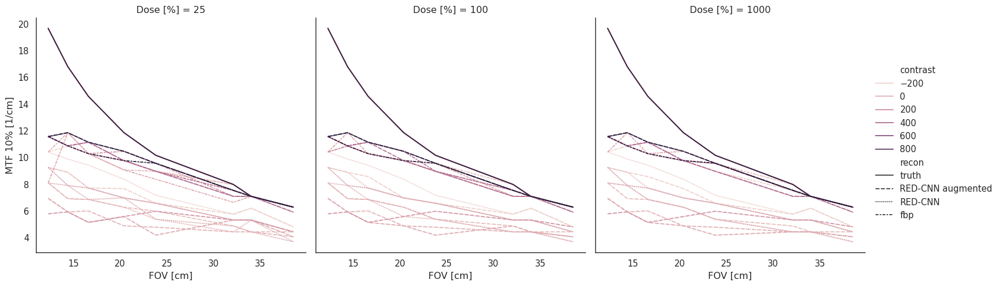

In [88]:
sns.relplot(data=mtf_df[(mtf_df['Dose [%]'].isin([25, 100, 1000]))], x='FOV [cm]', y='MTF 10% [1/cm]', hue='contrast', style='recon', col='Dose [%]', kind='line')

In [89]:
mtf_df.to_csv('results/mtf.csv', index=False)

In [90]:
mtf_df[(mtf_df['spatial frequency [1/cm]']==0)&(mtf_df['contrast']==-200)&(mtf_df['Dose [%]']==1000)&(mtf_df['spatial frequency [1/cm]']==0)&(mtf_df['recon']!='truth')][['name', 'MTF 10% [1/cm]', 'MTF 50% [1/cm]']]

,name,MTF 10% [1/cm],MTF 50% [1/cm]
1134,35.0 cm 1000% dose RED-CNN augmented -200 HU,4.802309,1.477633
1260,35.0 cm 1000% dose RED-CNN -200 HU,4.802309,2.585859
1386,35.0 cm 1000% dose fbp -200 HU,6.279942,3.694084
4599,15.0 cm 1000% dose RED-CNN augmented -200 HU,6.200692,1.771626
4662,15.0 cm 1000% dose RED-CNN -200 HU,6.200692,2.657439
4725,15.0 cm 1000% dose fbp -200 HU,7.086505,4.429066
7182,11.2 cm 1000% dose RED-CNN augmented -200 HU,9.250226,3.468835
7308,11.2 cm 1000% dose RED-CNN -200 HU,10.406504,4.625113
7434,11.2 cm 1000% dose fbp -200 HU,10.406504,5.781391
11214,18.5 cm 1000% dose RED-CNN augmented -200 HU,7.668845,2.788671
